***
<br>
<h1><center>Deep Learning Neural Networks</center></h1>

***
<br>
<br>
<center><font size="7">iWildCam 2019 - FGVC6</font></center>
<br>
<center><font size="6">Categorize animals in the wild</font></center>
<br>
<br>
<center><font size="6">Grupo 18</font></center>
<br>
<br>
<center>Catarina Valente -- m20190868</center>
<center>Miguel Gaspar -- m20191428</center>
<center>Rita Barroso -- m20190905</center>
<center>Tomás Rêgo -- m20190791</center>

# Table of Contents

<br></br>

* [1. Introduction](#introduction)

* [2. Imports](#imports)

* [3. Auxiliary Functions](#auxiliary-functions)

* [4. Exploratory Data Analysis](#exploratory-data-analysis)

    * [4.1: Data Description](#data-description)

    * [4.2: Data Visualization](#data-visualization)
   
    * [4.3: Data Preparation](#data-preparation)
 
* [5. Base Models](#models)

    * [5.1 Baseline Model](#baseline-model)
    
    * [5.2 Data Augmentation](#data-augmentation)
 
    * [5.3 Hyperparameter Tuning](#hyperparameter-tuning)
    
    * [5.4 Tuned Model](#tuned-model)
 
* [6. Pre-Trained Models](#pre-trained-models)
 
    * [6.1 VGG16](#vgg16)
    
    * [6.2 ResNet50](#resnet50)
    
    * [6.3 Inception V3](#inceptionv3)

* [7. Ensemble Model](#ensemle-model)

* [8. Conclusion](#conclusion)

* [9. References](#references)

<a class="anchor" id="introduction"></a>
# Introduction

Image recognition is one type of problem that humans solve intuitively and is, for that reason, hard to describe formally. Convolutional neural networks are neural networks with a very characteristic architecture that allow them to computationally solve this type of issue. In this project, we will develop a deep learning approach using convolutional neural networks to classify animals in pictures taken from the wild.

The dataset can be found here: https://www.kaggle.com/c/iwildcam-2019-fgvc6/data

<a class="anchor" id="imports"></a>
# Imports

In [1]:
# Imports from the standard library.
import os

# Third-party imports.
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, multilabel_confusion_matrix
from sklearn.model_selection import ParameterGrid, ParameterSampler
from sklearn.utils import class_weight
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.layers import AveragePooling2D, BatchNormalization, Conv2D, Dense, Dropout, Flatten, Input, Lambda, MaxPooling2D
from tensorflow.keras.metrics import SparseTopKCategoricalAccuracy
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

<a class="anchor" id="auxiliary-functions"></a>
# Auxiliary Functions

In [162]:
def build_cnn_model(model_name='CNN_Model', input_shape=(64,64,3), n_conv_layers=1, n_conv_filters=32, kernel_size=(3,3), stride_size=(1,1), conv_padding='valid',
                    conv_activation='relu', conv_thickness=1, batch_normalization=True, pool_type='max', pool_size=(2,2), pool_stride=(1,1), pool_padding='valid',
                    dropout=False, dropout_rate=0.10, n_dense_layers=1, n_dense_neurons=128, dense_activation='relu', optimizer='adam'):
    '''
    Creates a keras CNN model.
    Takes the following arguments:
    
    model_name:            (str); name of the model.
    input_shape:           (tuple); tuple containg input image dimensions (width, height, number of channels).
    n_conv_layers:         (int); number convolution + pooling (+dropout) stacks to use in the convolutional part of the network.
    n_conv_filters:        (int); number of filters in the Conv2D layer(s).
    kernel_size:           (tuple); size of the filter to use in the Conv2D layer(s). Tuple should contain integer values, which represent width x height of the filter.
    stride_size:           (tuple); by how many pixels should the convolutional filter move horizontally (first tuple integer) and vertically (second tuple integer).
    conv_padding:          (str); padding for the Conv2D filter relative to its input. Can be "valid" or "same". The former fits the filter inside the input, resulting
                                  in an output with reduced dimensions (width-2 x height-2), while the latter results in an output with the same dimensions as the input.
    conv_activation:       (str); activation function to apply in the Conv2D layers.
    conv_thickness:        (int); number of consecutive Conv2D layers to add before adding the pooling (+dropout) layer(s).
    batch_normalization:   (bool); whether to use batch normalization between the convolution and pooling layers.
    pool_type:             (str); whether to use maxpooling or averagepooling as the pooling operation after the convolution(s).
    pool_size:             (tuple); size of the filter to use in the pooling layer(s). Tuple should contain integer values, which represent width x height of the filter.
    pool_stride:           (tuple); by how many pixels should the pooling filter move horizontally (first tuple integer) and vertically (second tuple integer).
    pool_padding:          (str); padding for the pooling filter relative to its input. Can be "valid" or "same".
    dropout:               (bool); whether or not to use a Dropout layer after each convolutional+pooling stack.
    dropout_rate:          (float); if "dropout" is True, this argument represents the fraction of connections to drop from the previous layer.
    n_dense_layers:        (int); number of consecutive Dense layers to use in the fully connected part of the network.
    n_dense_neurons:       (int); number of neurons in the Dense layer(s).
    dense_activation:      (str); acivation function to apply in the Dense layer(s).
    optimizer:             (str); optimizer to use in the compilation step.
    
    Returns a compiled CNN model.
    '''
    
    # Load a Sequential model.
    model = Sequential(name=model_name)
    
    #################################
    ###    CONVOLUTION LAYERS    ###
    ################################

    # Convolution-MaxPool layer(s).
    for n in range(n_conv_layers):
        
        # Convolution.
        for m in range(conv_thickness):
            model.add(Conv2D(filters=n_conv_filters,
                             kernel_size=kernel_size,
                             strides=stride_size,
                             activation=conv_activation,
                             padding=conv_padding,
                             input_shape=input_shape
                            )
                     )
        
        # Batch Normalization.
        if batch_normalization:
            model.add(BatchNormalization())

        # Pooling.
        if pool_type == 'max':
            model.add(MaxPooling2D(pool_size=pool_size, strides=pool_stride, padding=pool_padding))
        elif pool_type == 'average':
            model.add(AveragePooling2D(pool_size=pool_size, strides=pool_stride, padding=pool_padding))

    #################################
    ###  FULLY CONNECTED LAYERS  ###
    ################################

    # Flatten layer.
    model.add(Flatten())

    # Dense layer(s).
    for k in range(n_dense_layers):
        model.add(Dense(n_dense_neurons, activation=dense_activation))
        
    # Dropout.
    if dropout:
        model.add(Dropout(dropout_rate))

    # Output layer.
    model.add(Dense(13, activation='softmax'))
    
    # Compile the model.
    model.compile(loss='sparse_categorical_crossentropy',
                  optimizer=optimizer,
                  metrics=[SparseTopKCategoricalAccuracy(k=1, name='accuracy')]
                 )

    return model


def extract_data_from_dataframe(df, base_dir, train_size=0.60, validation_size=0.50, target_size=(64,64), color_mode='rgb', class_mode='sparse', batch_size=32,
                                seed=None):
    '''
    Creates generator objects in which to load batches of images for each of the training, validation and test sets.
    Takes the following arguments:
    
    df:                (pandas.DataFrame); dataframe containing the image filenames, as well as their respective classes.
    base_dir:          (str); the base path where all images are located in.
    train_size:        (float); fraction of the whole dataset to set aside for training.
    validation_size:   (float); fraction of the remaining dataset to set aside for validation.
    target_size:       (tuple); dimensions to resize the images to.
    color_mode:        (str); whether to treat images as color ("rgb") or black-and-white ('grayscale'). This affects whether the images
                          have 3 channels (color) or only 1 channel (black-and-white).
    class_mode:        (str); how our classes are encoded. "sparse" is used when classes are assigned single integer labels; "categorical"
                          is used when when classes are one-hot encoded.
    batch_size:        (int); size of the batches into which we want to split our data.
    seed:              (int); random state that can be set to an integer for the purpose of reproducing results.
    
    Returns the three sets, as well as three generators, one for each of the training, validation, and test sets.
    '''

    # Set training set as a fraction of all images.
    train_set = df.sample(frac=train_size, replace=False, random_state=seed)

    # Remove the selected records from the total dataframe.
    df.drop(index=train_set.index, inplace=True)
    train_set.reset_index(inplace=True, drop=True)

    # From the remaining records, select a fraction as validation set (leaving the remainin fraction as testig set).
    validation_set = df.sample(frac=validation_size ,replace=False, random_state=seed)

    # Remove the selected records from the dataframe.
    df.drop(index=validation_set.index, inplace=True)
    validation_set.reset_index(inplace=True, drop=True)

    # Set remaining records as test set.
    test_set = df
    test_set.reset_index(inplace=True, drop=True)
    
    # For each set, create an ImageDataGenerator object for data augmentation. For the moment we will only rescale the pixel values.
    train_data_generator = ImageDataGenerator(rescale=1/255)
    validation_data_generator = ImageDataGenerator(rescale=1/255)
    test_data_generator = ImageDataGenerator(rescale=1/255)

    # Generate data from the images in each set directory in batches, while also resizing the images to save computation time, and feed the class labels and mode.
    # In this case, we will opt for a "sparse" class mode, since our categorical labels are represented by single integers instead of being one-hot encoded.
    train_generator = train_data_generator.flow_from_dataframe(dataframe=train_set,
                                                               directory=base_dir,
                                                               x_col='file_name',
                                                               y_col='class_label',
                                                               target_size=target_size,
                                                               color_mode=color_mode,
                                                               class_mode=class_mode,
                                                               batch_size=batch_size,
                                                               seed=seed
                                                              )
    
    validation_generator = validation_data_generator.flow_from_dataframe(dataframe=validation_set,
                                                                         directory=base_dir,
                                                                         x_col='file_name',
                                                                         y_col='class_label',
                                                                         target_size=target_size,
                                                                         color_mode=color_mode,
                                                                         class_mode=class_mode,
                                                                         batch_size=batch_size,
                                                                         seed=seed
                                                                        )
    
    test_generator = test_data_generator.flow_from_dataframe(dataframe=test_set,
                                                             directory=base_dir,
                                                             x_col='file_name',
                                                             y_col='class_label',
                                                             target_size=target_size,
                                                             color_mode=color_mode,
                                                             class_mode=class_mode,
                                                             batch_size=batch_size,
                                                             seed=seed
                                                            )
    
    return train_set, validation_set, test_set, train_generator, validation_generator, test_generator


def generate_ensemble_predictions(models_list, testX):
    '''
    This function performs ensemble predictions on test images using models contained in "models_list".
    Takes the following arguments:
    
    models_list:        (list); list of keras models to incorporate into the ensemble.
    testX:              (array); array containing matrix representations of a atch of images.
    
    Returns a numpy array of image class predictions.
    '''

    # Get predictions for each model on test images. 
    predictions = [model.predict(testX) for model in models_list]
    
    # Convert predictions list to numpy array.
    predictions = np.array(predictions)
    
    # Sum predictions across ensemble's models.
    summed_predictions = np.sum(predictions, axis=0)
    
    # Get most common image class across models.
    majority_prediction = np.argmax(summed_predictions, axis=-1)
    
    return majority_prediction


def plot_model_training_performance(model, n_epochs):
    '''
    Plots the train and validation loss and accuracy metrics.
    Takes the following arguments:
    
    model:      (keras.Model); keras model to inspect.
    n_epochs:   (int); number of epochs the model has trained for. Used for setting axes limits.
    
    Returns no object.
    '''

    # Initialize figure with subplots.
    n_metrics = len(model.metrics_names)
    fig, axes = plt.subplots(nrows=1, ncols=n_metrics, figsize=(12*n_metrics, 8))

    for n, metric in enumerate(model.metrics_names):
        
        # Get model history.
        try:
            model_history = pd.DataFrame(model.history.history)[[metric, 'val_' + metric]]
        except AttributeError:
            model_history = pd.DataFrame(model.history)[[metric, 'val_' + metric]]

        # Plot train and validation loss and accuracy.
        sns.lineplot(data=model_history, ax=axes[n], palette=['gray', 'firebrick'], linewidth=2, dashes=False)
    
        # Figure formatting.
        axes[n].set_title('Training-Validation\n' + metric.capitalize(), y=1.05, size=34, weight='bold')
        axes[n].set_xlabel('Epoch', size=20)
        axes[n].set_xlim(0, n_epochs)
        axes[n].set_xticks(range(0, n_epochs+1, 5))
        axes[n].set_xticklabels([int(label) for label in axes[n].get_xticks()])
        axes[n].set_ylabel(metric.capitalize(), size=20)
        ylimits = 0 if metric == 'loss' else (0, 1)
        axes[n].set_ylim(ylimits)
        axes[n].tick_params(axis='both', length=0, labelsize=14)
        axes[n].legend(fontsize=14)
    
    # Save figure.
    plt.savefig(fname=model.name.lower() + '_metrics.png', dpi=300, transparent=True, bbox_inches='tight')
    
    # Display figure.
    plt.show()
    plt.close()

In [3]:
# Set some working variables.
base_dir = r'C:\Users\Miguel Gaspar\Desktop\my_virtual_environments\Deep_Learning_Neural_Networks\working_dir\project\train_images'
seed = 1428 # random seed for reproducibility.

<a class="anchor" id="exploratory-data-analysis"></a>
# Exploratory Data Analysis

In any Data Science project, it is paramount to be intimately familiar with the data we are working with. In this section we will explore the dataset, and then prepare it for ingestion by our different models.

<a class="anchor" id="data-description"></a>
## Data Description

In [4]:
# Load the training metadata.
dataset = pd.read_csv('train.csv')
dataset

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height
0,19,2011-05-13 23:43:18,5998cfa4-23d2-11e8-a6a3-ec086b02610b.jpg,1,5998cfa4-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f084ccc-5567-11e8-bc84-dca9047ef277,3,1024,747
1,19,2012-03-17 03:48:44,588a679f-23d2-11e8-a6a3-ec086b02610b.jpg,2,588a679f-23d2-11e8-a6a3-ec086b02610b,115,Justin Brown,6f12067d-5567-11e8-b3c0-dca9047ef277,3,1024,747
2,0,2014-05-11 11:56:46,59279ce3-23d2-11e8-a6a3-ec086b02610b.jpg,1,59279ce3-23d2-11e8-a6a3-ec086b02610b,96,Erin Boydston,6faa92d1-5567-11e8-b1ae-dca9047ef277,1,1024,747
3,0,2013-10-06 02:00:00,5a2af4ab-23d2-11e8-a6a3-ec086b02610b.jpg,1,5a2af4ab-23d2-11e8-a6a3-ec086b02610b,57,Erin Boydston,6f7d4702-5567-11e8-9e03-dca9047ef277,1,1024,747
4,0,2011-07-12 13:11:16,599fbd89-23d2-11e8-a6a3-ec086b02610b.jpg,3,599fbd89-23d2-11e8-a6a3-ec086b02610b,46,Justin Brown,6f1728a1-5567-11e8-9be7-dca9047ef277,3,1024,747
...,...,...,...,...,...,...,...,...,...,...,...
196294,0,2013-10-04 12:33:13,597b495c-23d2-11e8-a6a3-ec086b02610b.jpg,1,597b495c-23d2-11e8-a6a3-ec086b02610b,26,Erin Boydston,6f20b923-5567-11e8-b4d7-dca9047ef277,1,1024,747
196295,0,2014-02-16 04:00:00,594e7621-23d2-11e8-a6a3-ec086b02610b.jpg,1,594e7621-23d2-11e8-a6a3-ec086b02610b,70,Erin Boydston,6fd3878c-5567-11e8-b9c2-dca9047ef277,1,1024,747
196296,4,2011-11-25 03:10:50,596d6468-23d2-11e8-a6a3-ec086b02610b.jpg,3,596d6468-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f0922e6-5567-11e8-b8c8-dca9047ef277,3,1024,747
196297,0,2014-03-27 05:00:00,58f5b062-23d2-11e8-a6a3-ec086b02610b.jpg,1,58f5b062-23d2-11e8-a6a3-ec086b02610b,106,Erin Boydston,6f710745-5567-11e8-bbfd-dca9047ef277,1,1024,747


In [5]:
# Check data types and any missing values.
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196299 entries, 0 to 196298
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   category_id     196299 non-null  int64 
 1   date_captured   196299 non-null  object
 2   file_name       196299 non-null  object
 3   frame_num       196299 non-null  int64 
 4   id              196299 non-null  object
 5   location        196299 non-null  int64 
 6   rights_holder   196299 non-null  object
 7   seq_id          196299 non-null  object
 8   seq_num_frames  196299 non-null  int64 
 9   width           196299 non-null  int64 
 10  height          196299 non-null  int64 
dtypes: int64(6), object(5)
memory usage: 16.5+ MB


In [6]:
# Defining the mapping from category IDs to class labels.
class_labels = {0: 'empty',
                1: 'deer',
                2: 'moose',
                3: 'squirrel',
                4: 'rodent',
                5: 'small_mammal',
                6: 'elk',
                7: 'pronghorn_antelope',
                8: 'rabbit',
                9: 'bighorn_sheep',
                10: 'fox',
                11: 'coyote',
                12: 'black_bear',
                13: 'raccoon',
                14: 'skunk',
                15: 'wolf',
                16: 'bobcat',
                17: 'cat',
                18: 'dog',
                19: 'opossum',
                20: 'bison',
                21: 'mountain_goat',
                22: 'mountain_lion',
               }

# Apply the mapping.
dataset['class_label'] = dataset['category_id'].map(class_labels)
dataset.head()

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height,class_label
0,19,2011-05-13 23:43:18,5998cfa4-23d2-11e8-a6a3-ec086b02610b.jpg,1,5998cfa4-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f084ccc-5567-11e8-bc84-dca9047ef277,3,1024,747,opossum
1,19,2012-03-17 03:48:44,588a679f-23d2-11e8-a6a3-ec086b02610b.jpg,2,588a679f-23d2-11e8-a6a3-ec086b02610b,115,Justin Brown,6f12067d-5567-11e8-b3c0-dca9047ef277,3,1024,747,opossum
2,0,2014-05-11 11:56:46,59279ce3-23d2-11e8-a6a3-ec086b02610b.jpg,1,59279ce3-23d2-11e8-a6a3-ec086b02610b,96,Erin Boydston,6faa92d1-5567-11e8-b1ae-dca9047ef277,1,1024,747,empty
3,0,2013-10-06 02:00:00,5a2af4ab-23d2-11e8-a6a3-ec086b02610b.jpg,1,5a2af4ab-23d2-11e8-a6a3-ec086b02610b,57,Erin Boydston,6f7d4702-5567-11e8-9e03-dca9047ef277,1,1024,747,empty
4,0,2011-07-12 13:11:16,599fbd89-23d2-11e8-a6a3-ec086b02610b.jpg,3,599fbd89-23d2-11e8-a6a3-ec086b02610b,46,Justin Brown,6f1728a1-5567-11e8-9be7-dca9047ef277,3,1024,747,empty


<a class="anchor" id="data-visualization"></a>
## Data Visualization

In [7]:
# Check the class distribution, i.e., how evenly each of the target classes is distributed in the dataset. 
grouped_categories = dataset.groupby('class_label', as_index=False)[['category_id']].count().sort_values(by='category_id', ascending=False).reset_index(drop=True)

# Rename columns.
grouped_categories.columns = ['class_label', 'class_count']

grouped_categories

,class_label,class_count
0,empty,131457
1,opossum,14106
2,raccoon,8623
3,coyote,7209
4,rabbit,6938
5,deer,6102
6,bobcat,5975
7,cat,4759
8,squirrel,3398
9,dog,3035


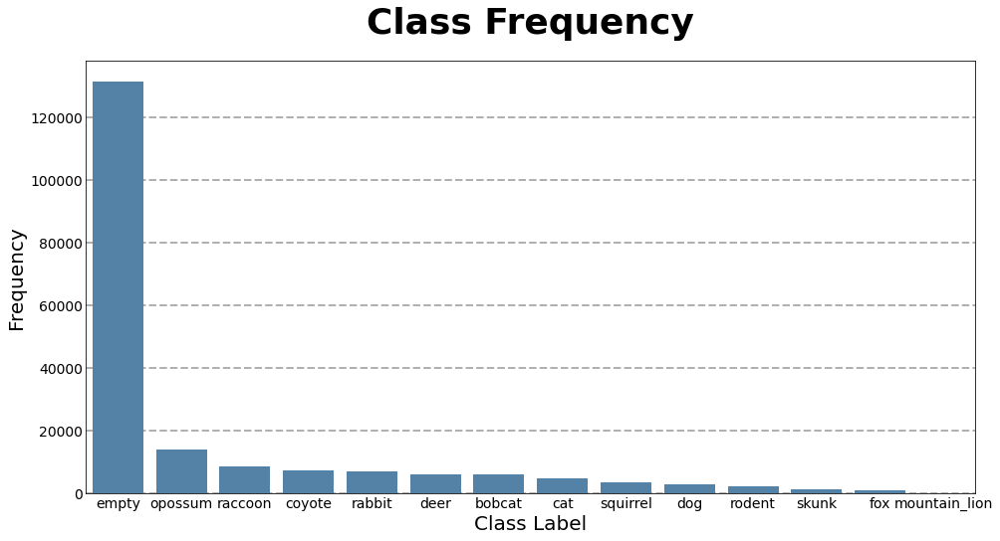

In [8]:
# Initialize figure.
fig, ax = plt.subplots(figsize=(16, 8))

# Draw the barplot.
sns.barplot(x='class_label',
            y='class_count',
            data=grouped_categories,
            color='steelblue',
            zorder=3
           )

# Figure formatting.
ax.set_title('Class Frequency', y=1.05, size=36, weight='bold')
ax.set_xlabel('Class Label', size=20)
ax.set_ylabel('Frequency', size=20)
ax.tick_params(axis='both', length=0, labelsize=14)
ax.grid(True, axis='y', linewidth=2, linestyle='--', zorder=-1)

# Display image.
plt.show()
plt.close()

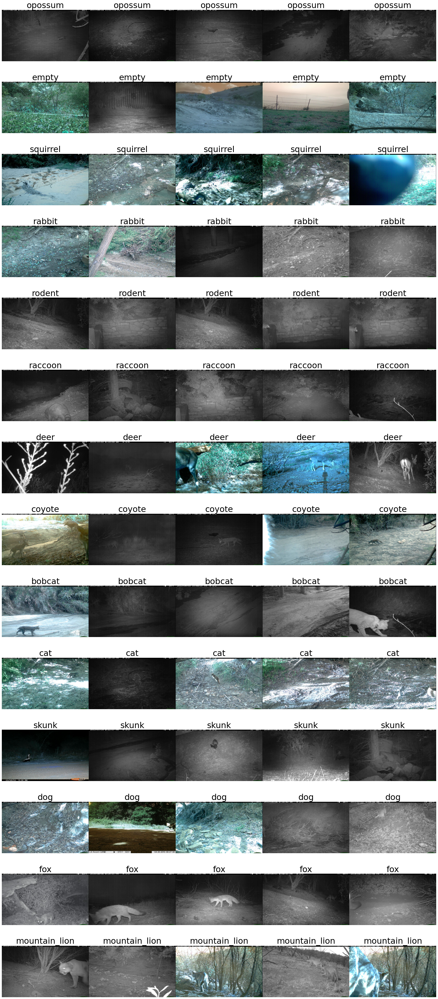

In [9]:
# Let's have a look at a few images for each of the classes present in our dataset.
n_classes = dataset['category_id'].nunique()
n_samples = 5

# Initialize figure.
fig, axes = plt.subplots(nrows=n_classes, ncols=n_samples, figsize=(30, 70))

# Iterate through each class.
for i, label in enumerate(dataset['class_label'].unique()):
    
    # Randomly select the samples to show.
    current_class = dataset[dataset['class_label']==label].sample(n=n_samples, replace=False, random_state=seed)
    
    # Iterate thoruh each sample.
    for j, (_, row) in enumerate(current_class.iterrows()):
        
        # Read and show the image.
        image_dir = cv2.imread(os.path.join(base_dir, row['file_name']))
        axes[i][j].imshow(image_dir)
        
        # Format figure.
        axes[i][j].set_title(label, size=32)
        axes[i][j].axis('off')
        axes[i][j].set_aspect('auto')
    plt.subplots_adjust(wspace=0, hspace=0.4)

- **Takeaways**

<br>

From the barplot, we can see that:

<br>

1) Of the 23 categories described on the Kaggle page, the dataset only contains 14 of them;
<br>

2) The classes are very unbalanced, with a vast preponderance of "empty" classes, and an accentuated lack of "mountain_lion" examples.

<br>

An imbalance in the target classes is problematic for any classification model, and neural networks are no exception. By having some classes that are under-represented, the model does not have enough data to properly train on those rarer classes, which will lead to misclassification of those scarcer classes. To combat this issue, we can downsample the "empty" class, and upsample the remaining classes using data augmentation. However, that would bloat an already very large dataset. Therefore, our strategy will be twofold: randomly remove many of the "empty" classes, as there are more examples than needed to train the network on this class, and apply class weights during model fitting, so that more "attention" is given by the model to the under-represented classes.

<br>

From looking at the images from each class, we can see that there is a lot of variability. This variability includes animal proximity, animal position, partial captures, multiple animals, and differences in illumination due to time of day. This type of variability is not necessarily bad (when applying data augmentation we are injecting some of this type of variability into a dataset), because it helps models to better generalize (assuming there are enough examples). However, the difference in illumination, specially between daytime and nighttime captures should be handled: a fox is still a fox whether at night or during the day, so the extra information from the difference in lighting should not add relevant information, as the model must be able to perform well regardless of light conditions. To address this, we will convert all images from RGB to grayscale. This will have the added advantage of collapsing the dimensionality of all images three-fold, since we will go from 3 color channels to only 1, which will save up on computational resources. For the sake of building a baseline model, we will not apply this transformation yet.

<a class="anchor" id="data-preparation"></a>
## Data Preparation

In [10]:
random_empty = dataset.copy()

# Downsample 20000 random records of the "empty" class.
random_empty = random_empty[random_empty['class_label']=='empty'].sample(n=20000, replace=False, random_state=seed)

random_empty

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height,class_label
97235,0,2014-04-17 13:07:30,596a4e9c-23d2-11e8-a6a3-ec086b02610b.jpg,1,596a4e9c-23d2-11e8-a6a3-ec086b02610b,26,Erin Boydston,6f2e0c07-5567-11e8-9d2a-dca9047ef277,1,1024,747,empty
179963,0,2013-11-29 20:00:00,59ec5568-23d2-11e8-a6a3-ec086b02610b.jpg,1,59ec5568-23d2-11e8-a6a3-ec086b02610b,57,Erin Boydston,6f80a866-5567-11e8-952a-dca9047ef277,1,1024,747,empty
80837,0,2014-08-20 15:40:04,5911d740-23d2-11e8-a6a3-ec086b02610b.jpg,1,5911d740-23d2-11e8-a6a3-ec086b02610b,76,Erin Boydston,6f63feb3-5567-11e8-ba7e-dca9047ef277,1,1024,747,empty
100436,0,2014-03-24 08:07:22,58f10721-23d2-11e8-a6a3-ec086b02610b.jpg,2,58f10721-23d2-11e8-a6a3-ec086b02610b,117,Justin Brown,701bac07-5567-11e8-981e-dca9047ef277,3,1024,747,empty
39440,0,2013-10-15 12:28:43,5a116e28-23d2-11e8-a6a3-ec086b02610b.jpg,1,5a116e28-23d2-11e8-a6a3-ec086b02610b,26,Erin Boydston,6f26ee8c-5567-11e8-88b8-dca9047ef277,1,1024,747,empty
...,...,...,...,...,...,...,...,...,...,...,...,...
49924,0,2014-03-05 07:59:53,58cb12a7-23d2-11e8-a6a3-ec086b02610b.jpg,1,58cb12a7-23d2-11e8-a6a3-ec086b02610b,114,Erin Boydston,6ffe9ef5-5567-11e8-8b1c-dca9047ef277,1,1024,747,empty
135311,0,2014-06-26 13:30:23,59a17c58-23d2-11e8-a6a3-ec086b02610b.jpg,1,59a17c58-23d2-11e8-a6a3-ec086b02610b,26,Erin Boydston,6f494511-5567-11e8-9691-dca9047ef277,1,1024,747,empty
112342,0,2014-05-09 13:40:01,5919964e-23d2-11e8-a6a3-ec086b02610b.jpg,1,5919964e-23d2-11e8-a6a3-ec086b02610b,96,Erin Boydston,6fa5c682-5567-11e8-b9c9-dca9047ef277,1,1024,747,empty
59841,0,2014-01-08 15:00:00,58fbed13-23d2-11e8-a6a3-ec086b02610b.jpg,1,58fbed13-23d2-11e8-a6a3-ec086b02610b,76,Erin Boydston,6f57d507-5567-11e8-aa06-dca9047ef277,1,1024,747,empty


In [11]:
trimmed_empty = dataset.copy()

# Remove all "empty" class records.
trimmed_empty = trimmed_empty[trimmed_empty['class_label']!='empty']

# Add the randomly selected 20000 "empty" class records back to the dataframe.
trimmed_empty = pd.concat([trimmed_empty, random_empty])

# Remove all "mountain_lion" records, since they are too few anyway for the network to properly learn how to classify them, and therefore it will impact the accuracy.
trimmed_empty = trimmed_empty[trimmed_empty['class_label']!='mountain_lion']

# Because we still have a very large dataset, and in the interest of time, we will trim down all classes down to 15% (thus preserving relative class proportions).
trimmed_dataset = pd.DataFrame()
for label in trimmed_empty['class_label'].unique():
    trimmed_class = trimmed_empty[trimmed_empty['class_label']==label].sample(frac=0.15, replace=False, random_state=seed)
    trimmed_dataset = pd.concat([trimmed_dataset, trimmed_class], axis=0)

# Sort the dataframe by index.
trimmed_dataset.sort_index(inplace=True)

trimmed_dataset

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height,class_label
5,3,2011-06-28 15:29:42,593d68d7-23d2-11e8-a6a3-ec086b02610b.jpg,3,593d68d7-23d2-11e8-a6a3-ec086b02610b,90,Justin Brown,6f0f6778-5567-11e8-b5d2-dca9047ef277,3,1024,747,squirrel
12,4,2014-09-28 01:00:53,595f7b9c-23d2-11e8-a6a3-ec086b02610b.jpg,2,595f7b9c-23d2-11e8-a6a3-ec086b02610b,67,Justin Brown,701cb328-5567-11e8-8d4a-dca9047ef277,3,1024,747,rodent
33,4,2011-07-13 23:44:22,59eab924-23d2-11e8-a6a3-ec086b02610b.jpg,2,59eab924-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f08b68a-5567-11e8-8cbd-dca9047ef277,3,1024,747,rodent
37,0,2014-06-15 07:00:00,5919967a-23d2-11e8-a6a3-ec086b02610b.jpg,1,5919967a-23d2-11e8-a6a3-ec086b02610b,106,Erin Boydston,6f76c940-5567-11e8-a6a7-dca9047ef277,1,1024,747,empty
48,13,2012-03-11 21:08:07,59cb3a96-23d2-11e8-a6a3-ec086b02610b.jpg,1,59cb3a96-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f09fee6-5567-11e8-bcf1-dca9047ef277,3,1024,747,raccoon
...,...,...,...,...,...,...,...,...,...,...,...,...
196224,19,2011-06-04 01:54:16,5a096a05-23d2-11e8-a6a3-ec086b02610b.jpg,2,5a096a05-23d2-11e8-a6a3-ec086b02610b,46,Justin Brown,6f168f1c-5567-11e8-8730-dca9047ef277,3,1024,747,opossum
196255,19,2011-04-25 04:51:28,5a0e35fc-23d2-11e8-a6a3-ec086b02610b.jpg,3,5a0e35fc-23d2-11e8-a6a3-ec086b02610b,40,Justin Brown,6f05b50c-5567-11e8-aba0-dca9047ef277,3,1024,747,opossum
196277,8,2011-07-22 15:08:14,59baca0b-23d2-11e8-a6a3-ec086b02610b.jpg,1,59baca0b-23d2-11e8-a6a3-ec086b02610b,43,Justin Brown,6f0b1719-5567-11e8-bf33-dca9047ef277,3,1024,747,rabbit
196280,8,2011-07-28 06:51:17,58d931e2-23d2-11e8-a6a3-ec086b02610b.jpg,3,58d931e2-23d2-11e8-a6a3-ec086b02610b,115,Justin Brown,6f118ce1-5567-11e8-97a1-dca9047ef277,3,1024,747,rabbit


In [12]:
# Load all the image data from the dataframe into the corresponding set and generator.
train_set, validation_set, test_set, train_generator, validation_generator, test_generator = extract_data_from_dataframe(trimmed_dataset.copy(),
                                                                                                                         base_dir,
                                                                                                                         target_size=(64,64),
                                                                                                                         color_mode='rgb',
                                                                                                                         batch_size=32,
                                                                                                                         seed=seed
                                                                                                                        )

Found 7633 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.


In [13]:
# Set parameters for training.
n_epochs = 20
n_classes = train_set['class_label'].nunique()

# Get class weights in an attempt to balance the training with our unbalanced classes. We will have to sort the class labels so that the weight indices match the label
# indices of train_generator.class_indices.
class_weights = class_weight.compute_class_weight(class_weight='balanced',
                                                  classes=sorted(train_set['class_label'].unique()), 
                                                  y=train_set['class_label'].values
                                                 )

# Store the weights and their respective labels in a dictionary for future use.
weights_dict = {label: weight for label, weight in zip(train_generator.class_indices.values(), class_weights)}
weights_dict

{0: 1.099539037741285,
 1: 1.3497789566755083,
 2: 0.9231978713110789,
 3: 1.0873219373219374,
 4: 2.1746438746438748,
 5: 0.3260154614957502,
 6: 5.991365777080063,
 7: 0.4506169195348013,
 8: 0.9737211379002424,
 9: 0.7394884712265065,
 10: 3.0422479075328814,
 11: 5.105685618729097,
 12: 1.8879544892406628}

In [14]:
# Let's confirm that the ordering, and therefore the label-weight mapping, is correct.
train_generator.class_indices

{'bobcat': 0,
 'cat': 1,
 'coyote': 2,
 'deer': 3,
 'dog': 4,
 'empty': 5,
 'fox': 6,
 'opossum': 7,
 'rabbit': 8,
 'raccoon': 9,
 'rodent': 10,
 'skunk': 11,
 'squirrel': 12}

<a class="anchor" id="models"></a>
# Models

<a class="anchor" id="baseline-model"></a>
## Baseline Model
The first model we will create will be a baseline model to assess the performance of a simple convolutional network out of the box. This will establish a standard to which additional models will be compared to.

In [15]:
# Build the baseline model.
baseline_model = build_cnn_model(model_name='Baseline_Model', n_conv_layers=1, batch_normalization=False)

# Check model properties.
print(baseline_model.summary())

Model: "Baseline_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 61, 61, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 119072)            0         
_________________________________________________________________
dense (Dense)                (None, 128)               15241344  
_________________________________________________________________
dense_1 (Dense)              (None, 13)                1677      
Total params: 15,243,917
Trainable params: 15,243,917
Non-trainable params: 0
_________________________________________________________________
None


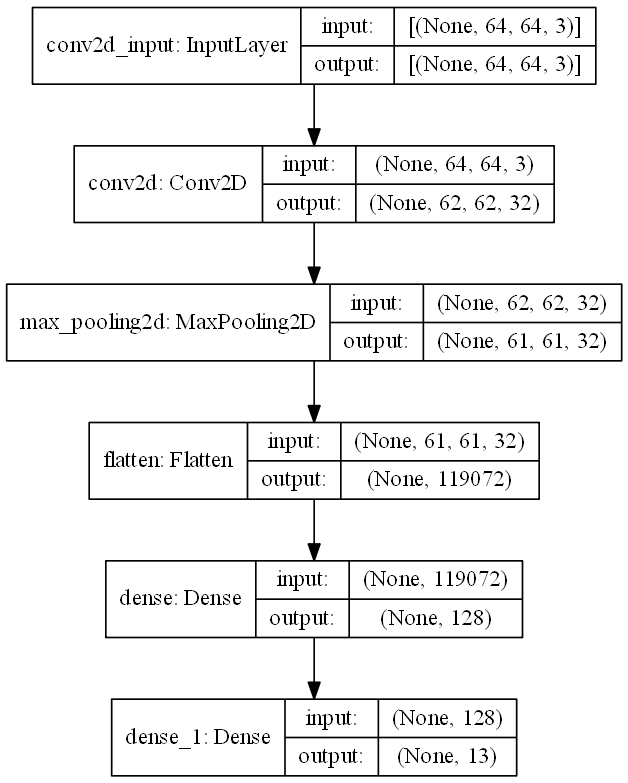

In [16]:
# Show model architecture.
plot_model(baseline_model, to_file='baseline_model_arquitecture.png', show_shapes=True, show_layer_names=True, dpi=120)

### Baseline without Class Weights
This will be our simplest implementation. Even though we are aware of class imbalance in our dataset, and have calculated class weights to combat the issue, here we will simply look at the performance of the model without any tuning or optimization.

In [17]:
model_savename = 'baseline_model_without_class_weights.h5'

# If the model has already been trained, load it, otherwise, train it.
if os.path.exists(os.path.join(os.path.dirname(base_dir), model_savename)):

    # Load the model.
    baseline_model = load_model(model_savename)
    
    # Load the pickled model history.
    history_dir = os.path.join(os.path.dirname(base_dir), model_savename[:-3] + '_train_history.pickle')
    with open(history_dir, 'rb') as history_file:
        baseline_model_history = pickle.load(history_file)
    
    # Set the loaded model history.
    baseline_model.history = baseline_model_history

else:
    
    # Train the baseline model without class weights to treat the class imbalance.
    baseline_model.fit(train_generator,
                       epochs=n_epochs,
                       validation_data=validation_generator,
                       class_weight=None,
                       workers=4
                      )

    # Save the baseline model so we don't have to retrain it in the future.
    baseline_model.save(model_savename)

    # Since the "save" method of the model doesn't save the training history, we will pickle it.
    with open(model_savename[:-3] + '_train_history.pickle', 'wb') as history_file:
        pickle.dump(baseline_model.history.history, history_file)

Epoch 1/20
239/239 [==============================] - 44s 182ms/step - loss: 4.5046 - accuracy: 0.3592 - val_loss: 1.3120 - val_accuracy: 0.5818
Epoch 2/20
239/239 [==============================] - 45s 188ms/step - loss: 1.1182 - accuracy: 0.6400 - val_loss: 1.1718 - val_accuracy: 0.6274
Epoch 3/20
239/239 [==============================] - 47s 195ms/step - loss: 0.8406 - accuracy: 0.7253 - val_loss: 1.0363 - val_accuracy: 0.6789
Epoch 4/20
239/239 [==============================] - 48s 198ms/step - loss: 0.6631 - accuracy: 0.7847 - val_loss: 1.0719 - val_accuracy: 0.6820
Epoch 5/20
239/239 [==============================] - 45s 186ms/step - loss: 0.5422 - accuracy: 0.8236 - val_loss: 0.9497 - val_accuracy: 0.7264
Epoch 6/20
239/239 [==============================] - 44s 184ms/step - loss: 0.4369 - accuracy: 0.8657 - val_loss: 1.0448 - val_accuracy: 0.7123
Epoch 7/20
239/239 [==============================] - 45s 186ms/step - loss: 0.3533 - accuracy: 0.8876 - val_loss: 1.0827 - val_ac

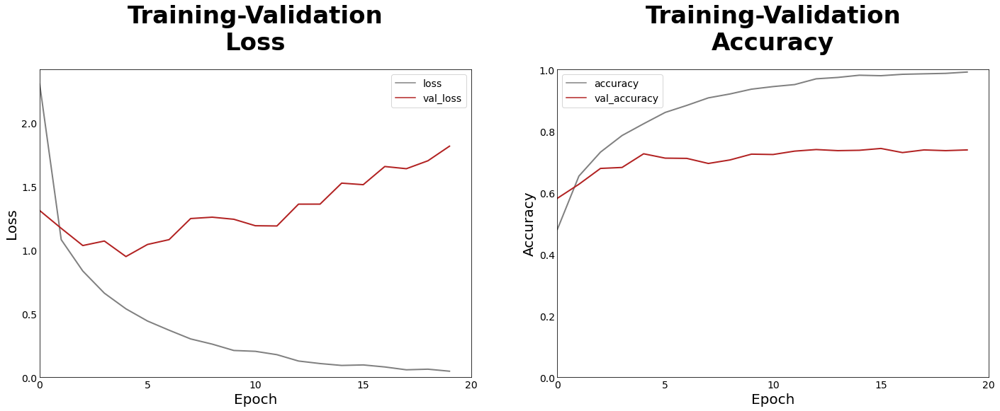

In [18]:
# Check training performance.
plot_model_training_performance(baseline_model, n_epochs)

### Baseline with Class Weights
Now that we have established a baseline level of performance, let's add the class weights to our simple model to see whether it shows any improvement.

In [19]:
# Build the baseline model.
baseline_model_class_weights = build_cnn_model(model_name='Baseline_Model', n_conv_layers=1, batch_normalization=False)

In [20]:
model_savename = 'baseline_model_with_class_weights.h5'

# If the model has already been trained, load it, otherwise, train it.
if os.path.exists(os.path.join(os.path.dirname(base_dir), model_savename)):

    # Load the model.
    baseline_model_with_class_weights = load_model(model_savename)
    
    # Load the pickled model history.
    history_dir = os.path.join(os.path.dirname(base_dir), model_savename[:-3] + '_train_history.pickle')
    with open(history_dir, 'rb') as history_file:
        baseline_model_with_class_weights_history = pickle.load(history_file)
    
    # Set the loaded model history.
    baseline_model_with_class_weights.history = baseline_model_with_class_weights_history

else:

    # Train the baseline model with calculated class weights.
    baseline_model_class_weights.fit(train_generator,
                                     epochs=n_epochs,
                                     validation_data=validation_generator,
                                     class_weight=weights_dict,
                                     workers=4
                                    )

    # Save the baseline model so we don't have to retrain it in the future.
    baseline_model_class_weights.save(model_savename)
    
    # Since the "save" method of the model doesn't save the training history, we will pickle it.
    with open(model_savename[:-3] + '_train_history.pickle', 'wb') as history_file:
        pickle.dump(baseline_model_class_weights.history.history, history_file)

Epoch 1/20
239/239 [==============================] - 49s 205ms/step - loss: 3.5775 - accuracy: 0.2792 - val_loss: 1.5078 - val_accuracy: 0.5417
Epoch 2/20
239/239 [==============================] - 51s 211ms/step - loss: 1.2796 - accuracy: 0.6104 - val_loss: 1.1660 - val_accuracy: 0.6262
Epoch 3/20
239/239 [==============================] - 48s 199ms/step - loss: 0.9191 - accuracy: 0.7039 - val_loss: 1.0293 - val_accuracy: 0.6722
Epoch 4/20
239/239 [==============================] - 49s 206ms/step - loss: 0.6065 - accuracy: 0.7830 - val_loss: 1.0078 - val_accuracy: 0.6812
Epoch 5/20
239/239 [==============================] - 49s 206ms/step - loss: 0.4620 - accuracy: 0.8266 - val_loss: 0.9830 - val_accuracy: 0.7020
Epoch 6/20
239/239 [==============================] - 51s 211ms/step - loss: 0.3916 - accuracy: 0.8547 - val_loss: 1.0231 - val_accuracy: 0.7268
Epoch 7/20
239/239 [==============================] - 50s 209ms/step - loss: 0.2496 - accuracy: 0.8966 - val_loss: 1.0853 - val_ac

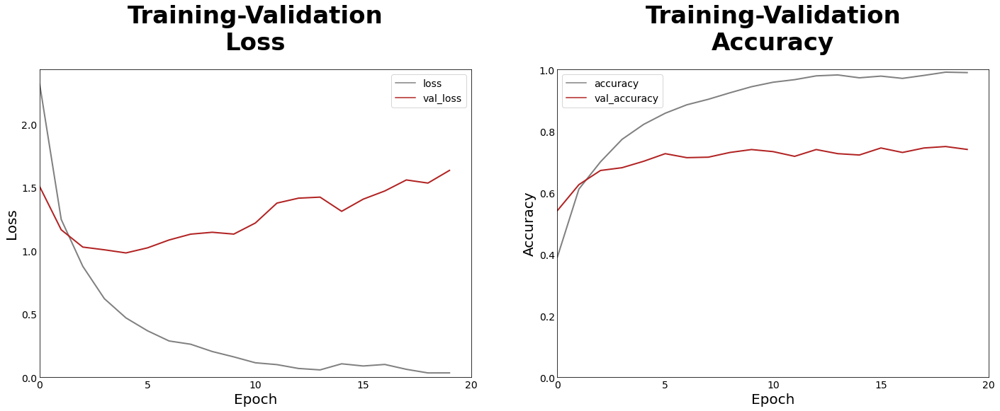

In [21]:
# Check training performance.
plot_model_training_performance(baseline_model_class_weights, n_epochs)

- **Takeaways**

<br>

From the baseline models, we can see conclude the following:

<br>


- Both models show clear signs of overfitting, since the validation accuracy quickly reaches a plateau and stagnates, while the training accuracy continues to increase;
<br>

- The addition of class weights has no effect in reducing overfitting, providing, for now, only a marginal gain in both training and validation accuracy.

<a class="anchor" id="data-augmentation"></a>
## Data Augmentation
One way to try and reduce overfitting is to feed the model what is called augmented data. Augmented data is synthetic data created by applying random transformations to the original data. These transformations range from brightness or rotation changes, to zooms and flips. For a neural network to properly generalize for problems dealing wit image classification, it is important that it be fed not only large volumes of data, but that that data is also varied. As such, data augmentation seeks to supply this variability, by artificially injecting into the dataset.

In [26]:
# Create a new training set with augmented images.
new_train_data_generator = ImageDataGenerator(
                                              rescale=1/255,
                                              brightness_range=[0.8, 1.2], # Range by how much to decrease (values < 1) or increase (values > 1) image brightness.
                                              rotation_range=30, # Value in degrees (0-180) to compose a range to randomly rotate images.
                                              width_shift_range=0.2, # Range (fraction of total width) to randomly translate images vertically.
                                              height_shift_range=0.2, # The same as previous but for height/horizontal translation.
                                              shear_range=0.2, # Randomly applying shearing transformations.
                                              zoom_range=0.4, # Randomly zooming inside of images.
                                              horizontal_flip=True, # Randomly flipping half of the images horizontally.
                                              fill_mode='nearest' # Strategy used for filling in newly created pixels.
                                             )

# Create new training generator with augmented data batches and resized images.
new_train_generator = new_train_data_generator.flow_from_dataframe(dataframe=train_set,
                                                                   directory=base_dir,
                                                                   x_col='file_name',
                                                                   y_col='class_label',
                                                                   target_size=(64,64),
                                                                   color_mode='rgb',
                                                                   class_mode='sparse',
                                                                   batch_size=32,
                                                                   seed=seed
                                                                  )

# Create a new validation set with augmented images.
new_validation_data_generator = ImageDataGenerator(
                                                   rescale=1/255,
                                                   brightness_range=[0.2, 1.2], # Range by how much to decrease (values < 1) or increase (values > 1) image brightness.
                                                   rotation_range=30, # Value in degrees (0-180) to compose a range to randomly rotate images.
                                                   width_shift_range=0.5, # Range (fraction of total width) to randomly translate images vertically.
                                                   height_shift_range=0.5, # The same as previous but for height/horizontal translation.
                                                   shear_range=0.2, # Randomly applying shearing transformations.
                                                   zoom_range=0.5, # Randomly zooming inside of images.
                                                   horizontal_flip=True, # Randomly flipping half of the images horizontally.
                                                   fill_mode='nearest' # Strategy used for filling in newly created pixels.
                                                  )

# Create new training generator with augmented data batches and resized images.
new_validation_generator = new_validation_data_generator.flow_from_dataframe(dataframe=validation_set,
                                                                             directory=base_dir,
                                                                             x_col='file_name',
                                                                             y_col='class_label',
                                                                             target_size=(64,64),
                                                                             color_mode='rgb',
                                                                             class_mode='sparse',
                                                                             batch_size=32,
                                                                             seed=seed
                                                                            )

Found 7633 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.


In [27]:
# Build the augmented model.
augmented_model = build_cnn_model(model_name='Augmented_Model', n_conv_layers=1, batch_normalization=False)

# Check model properties.
print(augmented_model.summary())

Model: "Augmented_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 61, 61, 32)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 119072)            0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               15241344  
_________________________________________________________________
dense_7 (Dense)              (None, 13)                1677      
Total params: 15,243,917
Trainable params: 15,243,917
Non-trainable params: 0
_________________________________________________________________
None


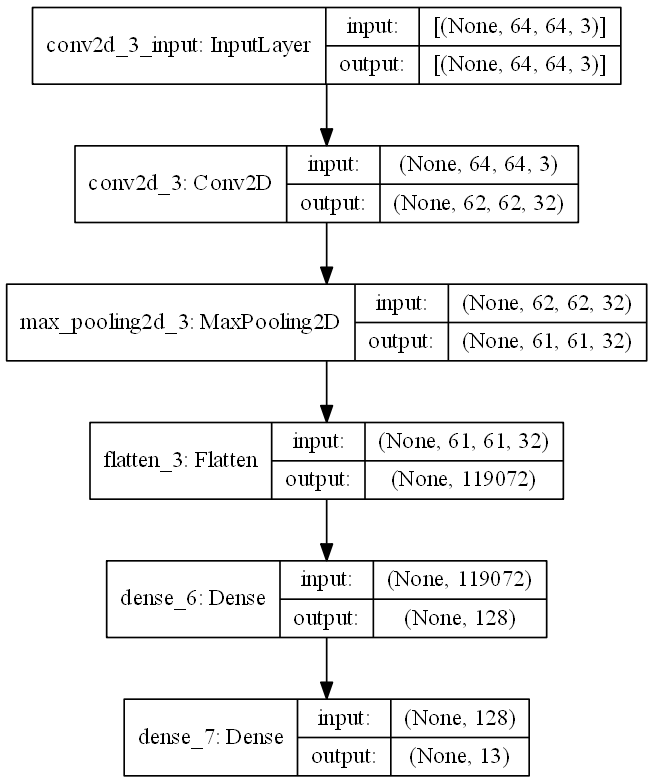

In [28]:
# Show model architecture.
plot_model(augmented_model, to_file='augmented_model_arquitecture.png', show_shapes=True, show_layer_names=True, dpi=120)

In [29]:
model_savename = 'augmented_model.h5'

# If the model has already been trained, load it, otherwise, train it.
if os.path.exists(os.path.join(os.path.dirname(base_dir), model_savename)):

    # Load the model.
    augmented_model = load_model(model_savename)
    
    # Load the pickled model history.
    history_dir = os.path.join(os.path.dirname(base_dir), model_savename[:-3] + '_train_history.pickle')
    with open(history_dir, 'rb') as history_file:
        augmented_model_history = pickle.load(history_file)
    
    # Set the loaded model history.
    augmented_model.history = augmented_model_history

else:

    # Train the augmented model.
    augmented_model.fit(new_train_generator,
                        epochs=n_epochs,
                        validation_data=new_validation_generator,
                        class_weight=weights_dict,
                        workers=4
                       )

    # Save the augmented model so we don't have to retrain it in the future.
    augmented_model.save(model_savename)
    
    # Since the "save" method of the model doesn't save the training history, we will pickle it.
    with open(model_savename[:-3] + '_train_history.pickle', 'wb') as history_file:
        pickle.dump(augmented_model.history.history, history_file)

Epoch 1/20
239/239 [==============================] - 56s 232ms/step - loss: 4.4087 - accuracy: 0.1493 - val_loss: 2.4188 - val_accuracy: 0.1726
Epoch 2/20
239/239 [==============================] - 55s 229ms/step - loss: 2.2828 - accuracy: 0.2343 - val_loss: 2.3489 - val_accuracy: 0.2469
Epoch 3/20
239/239 [==============================] - 56s 232ms/step - loss: 2.2386 - accuracy: 0.2711 - val_loss: 2.4462 - val_accuracy: 0.1895
Epoch 4/20
239/239 [==============================] - 56s 233ms/step - loss: 2.1862 - accuracy: 0.3001 - val_loss: 2.4826 - val_accuracy: 0.1765
Epoch 5/20
239/239 [==============================] - 55s 231ms/step - loss: 2.1404 - accuracy: 0.2972 - val_loss: 2.6921 - val_accuracy: 0.1682
Epoch 6/20
239/239 [==============================] - 55s 227ms/step - loss: 2.0888 - accuracy: 0.3212 - val_loss: 2.8122 - val_accuracy: 0.1753
Epoch 7/20
239/239 [==============================] - 55s 231ms/step - loss: 2.0441 - accuracy: 0.3207 - val_loss: 2.6157 - val_ac

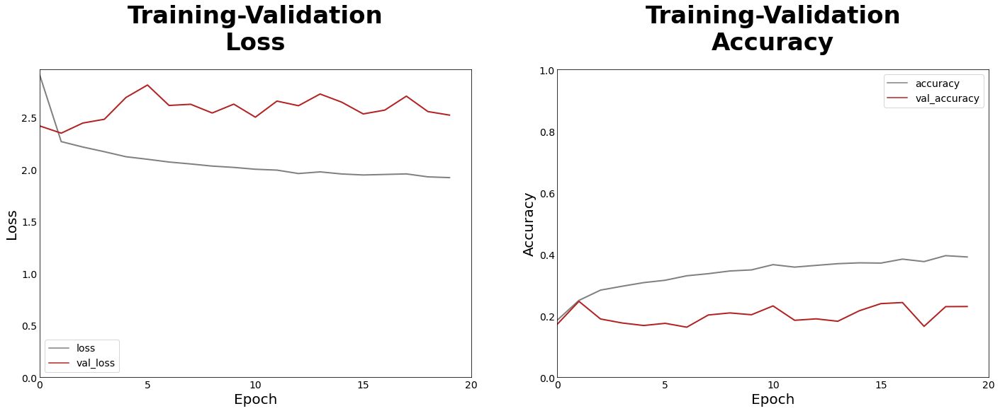

In [30]:
# Check training performance.
plot_model_training_performance(augmented_model, n_epochs)

In [31]:
# Evaluate augmented model against the test set.
test_loss, test_accuracy = augmented_model.evaluate(test_generator)
print('Test accuracy:', test_accuracy)

80/80 [==============================] - 14s 170ms/step - loss: 1.6451 - accuracy: 0.4513
Test accuracy: 0.4512578547000885


- **Takeaways**

<br>

From the augmented model, we can see conclude the following:

<br>

- The training on augmented data has indeed had a positive effect in limiting overfitting, since both training and validation curves are significantly closer to each other than in the baseline models;
<br>

- However, this amelioration of overfitting is coming at the cost of a drastic reduction in the model's performance, reaching an accuracy score of around 40%.
<br>

While overfitting is a troublesome symptom in our models, its limitation should not come at such a high performance cost. Therefore, with the current evidence, we will not be ingesting augmented data in the next models.

<a class="anchor" id="hyperparameter-tuning"></a>
## Hyperparameter Tuning
Given infinite time and computational resources, we could, one by one, test the effect of changing each of the model's hyperparameters to each of its possible values in order to find the combination of hyperparameters that leads to the best performing model.

<img src=https://memegenerator.net/img/instances/72296984/still-waiting-for-my-neural-network-to-train.jpg>

Since that is not feasible, we can instead select a few values for each of the hyperparameters we wish to adjust in our model, and train N models with N different random combinations of those hyperparamter values. Although we will never explore the full possibility space of hyperparamters, we can settle for the best performing model out of the N trained on its subset.



	Training Model Nr. 1 of 4 

Training with params:
 {'target_size': (32, 32), 'pool_type': 'max', 'optimizer': 'adam', 'n_dense_neurons': 32, 'n_dense_layers': 3, 'n_conv_layers': 3, 'n_conv_filters': 64, 'dropout_rate': 0.2, 'dropout': True, 'conv_thickness': 1, 'color_mode': 'rgb', 'batch_size': 64, 'batch_normalization': False} 

Found 7633 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Epoch 1/20
120/120 [==============================] - 47s 384ms/step - loss: 2.4716 - accuracy: 0.1317 - val_loss: 2.2474 - val_accuracy: 0.2626
Epoch 2/20
120/120 [==============================] - 45s 374ms/step - loss: 2.3124 - accuracy: 0.2494 - val_loss: 1.9534 - val_accuracy: 0.3581
Epoch 3/20
120/120 [==============================] - 46s 377ms/step - loss: 2.1194 - accuracy: 0.3540 - val_loss: 1.8667 - val_accuracy: 0.3781
Epoch 4/20
120/120 [======================

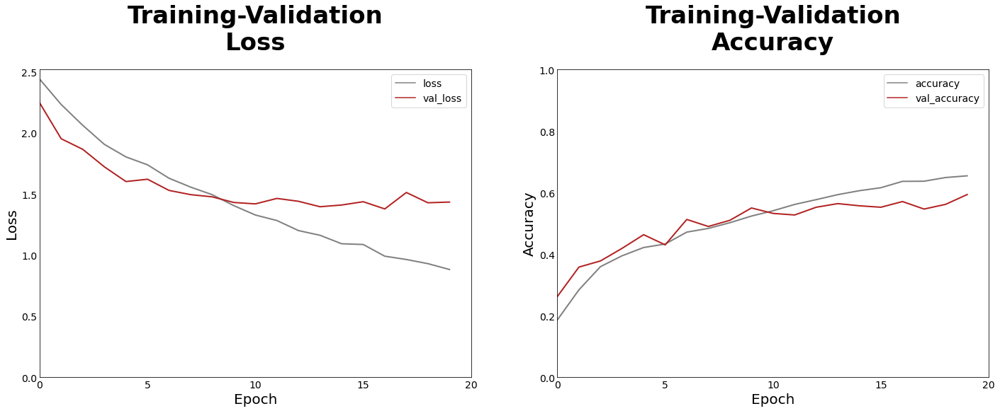

40/40 [==============================] - 13s 332ms/step - loss: 1.3918 - accuracy: 0.5932
Test accuracy: 0.5931603908538818


	Training Model Nr. 2 of 4 

Training with params:
 {'target_size': (32, 32), 'pool_type': 'average', 'optimizer': 'adam', 'n_dense_neurons': 32, 'n_dense_layers': 3, 'n_conv_layers': 3, 'n_conv_filters': 32, 'dropout_rate': 0.4, 'dropout': False, 'conv_thickness': 2, 'color_mode': 'grayscale', 'batch_size': 128, 'batch_normalization': True} 

Found 7633 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Epoch 1/20
60/60 [==============================] - 45s 730ms/step - loss: 2.3699 - accuracy: 0.2331 - val_loss: 2.4816 - val_accuracy: 0.0747
Epoch 2/20
60/60 [==============================] - 48s 782ms/step - loss: 1.8729 - accuracy: 0.4388 - val_loss: 2.5229 - val_accuracy: 0.0751
Epoch 3/20
60/60 [==============================] - 45s 

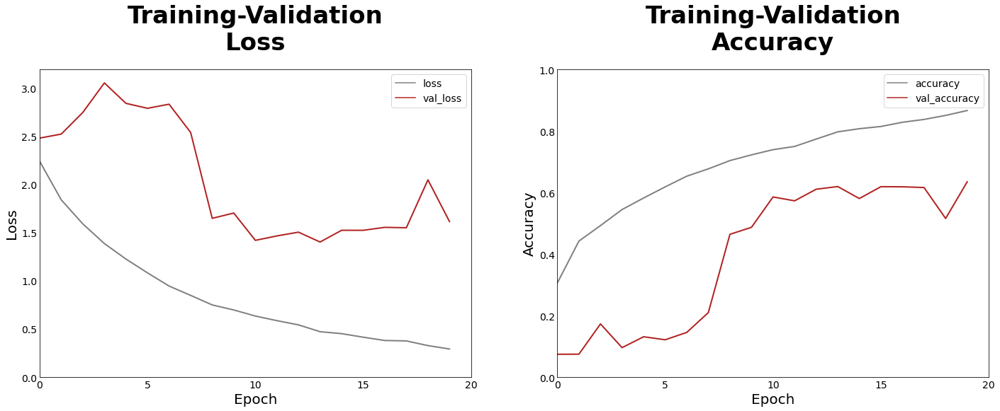

20/20 [==============================] - 16s 791ms/step - loss: 1.4615 - accuracy: 0.6623
Test accuracy: 0.6623427867889404


	Training Model Nr. 3 of 4 

Training with params:
 {'target_size': (64, 64), 'pool_type': 'max', 'optimizer': 'sgd', 'n_dense_neurons': 128, 'n_dense_layers': 3, 'n_conv_layers': 1, 'n_conv_filters': 32, 'dropout_rate': 0.1, 'dropout': True, 'conv_thickness': 3, 'color_mode': 'grayscale', 'batch_size': 128, 'batch_normalization': True} 

Found 7633 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Epoch 1/20
60/60 [==============================] - 99s 2s/step - loss: 2.3255 - accuracy: 0.1839 - val_loss: 2.5367 - val_accuracy: 0.1132
Epoch 2/20
60/60 [==============================] - 100s 2s/step - loss: 1.8861 - accuracy: 0.4006 - val_loss: 2.4340 - val_accuracy: 0.3294
Epoch 3/20
60/60 [==============================] - 99s 2s/step - 

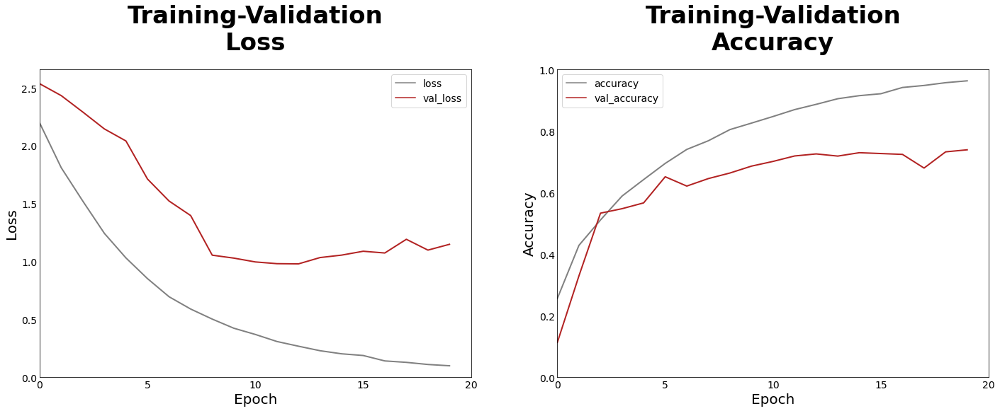

20/20 [==============================] - 18s 871ms/step - loss: 1.1412 - accuracy: 0.7351
Test accuracy: 0.7350628972053528


	Training Model Nr. 4 of 4 

Training with params:
 {'target_size': (64, 64), 'pool_type': 'max', 'optimizer': 'adam', 'n_dense_neurons': 128, 'n_dense_layers': 2, 'n_conv_layers': 1, 'n_conv_filters': 64, 'dropout_rate': 0.4, 'dropout': True, 'conv_thickness': 3, 'color_mode': 'grayscale', 'batch_size': 128, 'batch_normalization': True} 

Found 7633 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Found 2544 validated image filenames belonging to 13 classes.
Epoch 1/20
60/60 [==============================] - 214s 4s/step - loss: 5.5892 - accuracy: 0.1923 - val_loss: 2.5458 - val_accuracy: 0.0283
Epoch 2/20
60/60 [==============================] - 217s 4s/step - loss: 1.9024 - accuracy: 0.3823 - val_loss: 2.5763 - val_accuracy: 0.0193
Epoch 3/20
60/60 [==============================] - 213s 4s/step

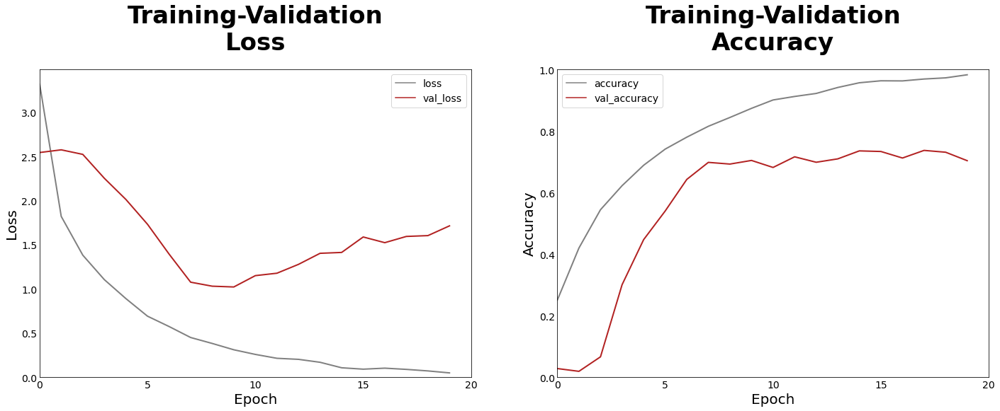

20/20 [==============================] - 22s 1s/step - loss: 1.6857 - accuracy: 0.7087
Test accuracy: 0.7087264060974121


In [35]:
# Set parameters to use in searching for the optimal model configuration.
param_grid = {'target_size': [(32,32), (64,64)],
              'color_mode': ['rgb', 'grayscale'],
              'batch_size': [16, 64, 128],
              'n_conv_layers': [1, 2, 3],
              'n_conv_filters': [32, 64],
              'conv_thickness': [1, 2, 3],
              'pool_type': ['max', 'average'],
              'batch_normalization': [True, False],
              'dropout': [True, False],
              'dropout_rate': [round(rate, 2) for rate in np.arange(0.10, 0.60, 0.10).tolist()],
              'n_dense_layers': [1, 2, 3],
              'n_dense_neurons': [32, 64, 128],
              'optimizer': ['adam', 'sgd']
             }

# Get 4 random combinations of parameters from the grid. <-- Originally 20, but time constraints, and approaching deadlines.
param_list = list(ParameterSampler(param_distributions=param_grid, n_iter=4, random_state=seed-1))

# Initialize a dictionary to store all of the models' parameters and scores.
models_dict = {}
for n, params in enumerate(param_list):
    
    print('\n\n\tTraining Model Nr.', n + 1, 'of', len(param_list), '\n')
    print('Training with params:\n', params, '\n')
    
    # Get parameters for changing the image inputs.
    input_grid = {'target_size': params['target_size'],
                  'color_mode': params['color_mode'],
                  'batch_size': params['batch_size']
                 }
    
    # Load all the image data from the dataframe into the corresponding set and generator, using the input parameters..
    _, _, _, temp_train_gen, temp_validation_gen, temp_test_gen = extract_data_from_dataframe(trimmed_dataset.copy(),
                                                                                              base_dir,
                                                                                              seed=seed,
                                                                                              **input_grid
                                                                                             )
    
    # Get parameters to change the model's architecture.
    model_grid = params.copy()
    for key in input_grid:
        model_grid.pop(key)
    
    # Build the temporary model model.
    n_dims = 1 if input_grid['color_mode'] == 'grayscale' else 3
    input_shape = (*input_grid['target_size'], n_dims)
    temp_model = build_cnn_model(model_name='Temp_Model', input_shape=input_shape, **model_grid)

    # Train the temporary model.
    temp_model.fit(temp_train_gen,
                   epochs=n_epochs,
                   validation_data=temp_validation_gen,
                   class_weight=weights_dict,
                   workers=4
                  )
    
    # Save last epoch's accuracy, as well as the current training parameters se we can get the best score and parameters later.
    models_dict[n] = {'accuracy': temp_model.history.history['accuracy'][-1],
                      'parameters': params
                     }
    
    # Check training performance.
    plot_model_training_performance(temp_model, n_epochs)
    
    # Evaluate batch normalization model against the test set.
    test_loss, test_accuracy = temp_model.evaluate(temp_test_gen)
    print('Test accuracy:', test_accuracy)

In [40]:
# Get the best score from the randomized search (accuracy, in this case).
accuracies = [model['accuracy'] for model in list(models_dict.values())]
best_score = max(accuracies)
best_score

0.983230710029602

In [41]:
# Get the best parameters (i.e., those that result in the best accuracy score) from the randomized search.
best_model = np.argmax(accuracies)
best_parameters = models_dict[best_model]['parameters']
best_parameters

{'target_size': (64, 64),
 'pool_type': 'max',
 'optimizer': 'adam',
 'n_dense_neurons': 128,
 'n_dense_layers': 2,
 'n_conv_layers': 1,
 'n_conv_filters': 64,
 'dropout_rate': 0.4,
 'dropout': True,
 'conv_thickness': 3,
 'color_mode': 'grayscale',
 'batch_size': 128,
 'batch_normalization': True}

- **Takeaways**

<br>

We have tested a range of different parameters with different values, and assigned those parameters to train different models. From these, we can see that we can obtain models with wildly different accuracy scores and overfitting intensities. Specifically, candidate model 4 achieved very high training accuracy, with lowered overfitting, when compared to the baseline model (although with still enough overfitting that it should be addressed).

<a class="anchor" id="tuned-model"></a>
## Tuned Model
Now that we have sampled some hyperparameters, let's implement the best performing one.

In [58]:
# Get parameters for changing the image inputs.
tuned_input_grid = {'target_size': best_parameters['target_size'],
                    'color_mode': best_parameters['color_mode'],
                    'batch_size': best_parameters['batch_size']
                   }

# Load all the image data from the dataframe into the corresponding set and generator, using the input parameters..
_, _, _, temp_train_gen, temp_validation_gen, temp_test_gen = extract_data_from_dataframe(trimmed_dataset.copy(),
                                                                                          base_dir,
                                                                                          seed=seed,
                                                                                          **tuned_input_grid
                                                                                         )

# Get the best model parameters.
n_dims = 1 if best_parameters['color_mode'] == 'grayscale' else 3
input_shape = (*best_parameters['target_size'], n_dims)

tuned_model_grid = best_parameters.copy()
for key in input_grid:
    tuned_model_grid.pop(key)

# Build the tuned model.
tuned_model = build_cnn_model(model_name='Tuned_Model', input_shape=input_shape, **tuned_model_grid)

# Check model properties.
print(augmented_model.summary())

Model: "Augmented_Model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 62, 62, 32)        896       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 61, 61, 32)        0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 119072)            0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               15241344  
_________________________________________________________________
dense_7 (Dense)              (None, 13)                1677      
Total params: 15,243,917
Trainable params: 15,243,917
Non-trainable params: 0
_________________________________________________________________
None


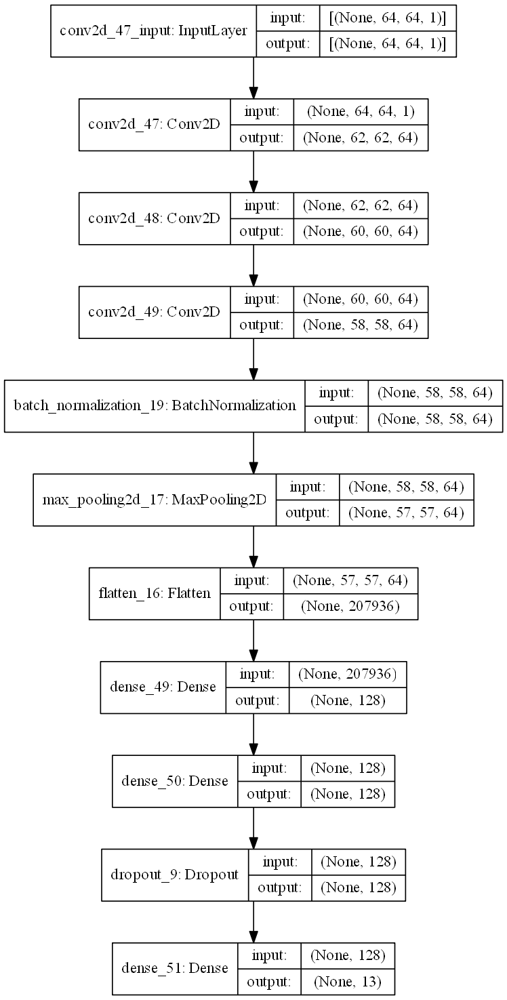

In [59]:
# Show model architecture.
plot_model(tuned_model, to_file='tuned_model_arquitecture.png', show_shapes=True, show_layer_names=True, dpi=120)

In [60]:
model_savename = 'tuned_model.h5'

# If the model has already been trained, load it, otherwise, train it.
if os.path.exists(os.path.join(os.path.dirname(base_dir), model_savename)):

    # Load the model.
    tuned_model = load_model(model_savename)
    
    # Load the pickled model history.
    history_dir = os.path.join(os.path.dirname(base_dir), model_savename[:-3] + '_train_history.pickle')
    with open(history_dir, 'rb') as history_file:
        tuned_model_history = pickle.load(history_file)
    
    # Set the loaded model history.
    tuned_model.history = tuned_model_history

else:

    # Train the tuned model.
    tuned_model.fit(temp_train_gen,
                    epochs=n_epochs,
                    validation_data=temp_validation_gen,
                    class_weight=weights_dict,
                    workers=4
                   )

    # Save the augmented model so we don't have to retrain it in the future.
    tuned_model.save(model_savename)
    
    # Since the "save" method of the model doesn't save the training history, we will pickle it.
    with open(model_savename[:-3] + '_train_history.pickle', 'wb') as history_file:
        pickle.dump(tuned_model.history.history, history_file)

Epoch 1/20
60/60 [==============================] - 203s 3s/step - loss: 5.1807 - accuracy: 0.1657 - val_loss: 2.5963 - val_accuracy: 0.0142
Epoch 2/20
60/60 [==============================] - 202s 3s/step - loss: 1.9414 - accuracy: 0.3893 - val_loss: 2.5105 - val_accuracy: 0.1073
Epoch 3/20
60/60 [==============================] - 205s 3s/step - loss: 1.4686 - accuracy: 0.5198 - val_loss: 2.3237 - val_accuracy: 0.3361
Epoch 4/20
60/60 [==============================] - 204s 3s/step - loss: 1.1764 - accuracy: 0.6042 - val_loss: 2.1477 - val_accuracy: 0.3648
Epoch 5/20
60/60 [==============================] - 205s 3s/step - loss: 0.9034 - accuracy: 0.6714 - val_loss: 1.8709 - val_accuracy: 0.4839
Epoch 6/20
60/60 [==============================] - 205s 3s/step - loss: 0.7460 - accuracy: 0.7227 - val_loss: 1.7369 - val_accuracy: 0.4996
Epoch 7/20
60/60 [==============================] - 203s 3s/step - loss: 0.5814 - accuracy: 0.7716 - val_loss: 1.4550 - val_accuracy: 0.5487
Epoch 8/20
60

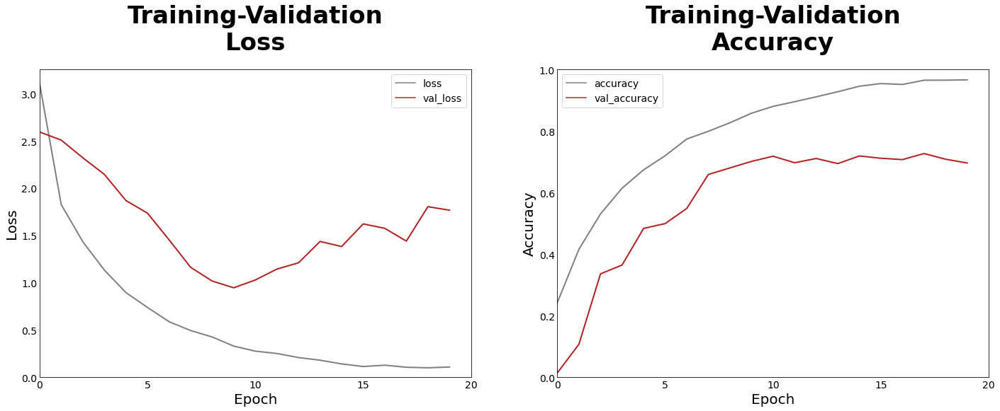

In [61]:
# Check training performance.
plot_model_training_performance(tuned_model, n_epochs)

In [63]:
# Evaluate tuned model against the test set.
tuned_model.evaluate(temp_test_gen)

20/20 [==============================] - 23s 1s/step - loss: 1.6343 - accuracy: 0.7032


[1.634337067604065, 0.7032232880592346]

In [64]:
# Create empty arrays to store all model predictions and all true labels.
y_pred = np.array([], dtype=int)
y_true = np.array([], dtype=int)

# Reset the generator after we have looped through it in case we need to run it again.
test_generator.reset()
for _ in range(len(temp_test_gen)):
    
    # Get the next batch of images and associated labels in the generator.
    X_test, y_test = temp_test_gen.next()

    # Get model prediction.
    prediction = np.argmax(tuned_model.predict(X_test), axis=-1)
    
    # Save prediction and true label.
    y_pred = np.append(y_pred, prediction)
    y_true = np.append(y_true, y_test)

# Check predictions.
y_pred

array([ 9,  9, 12, ...,  1,  7,  6], dtype=int64)

In [65]:
# Reverse the mapping from the generator's class indices so we can map the model predictions and true labels to the corresponding class names.
label_mapping = {index: label for label, index in train_generator.class_indices.items()}
label_mapping

{0: 'bobcat',
 1: 'cat',
 2: 'coyote',
 3: 'deer',
 4: 'dog',
 5: 'empty',
 6: 'fox',
 7: 'opossum',
 8: 'rabbit',
 9: 'raccoon',
 10: 'rodent',
 11: 'skunk',
 12: 'squirrel'}

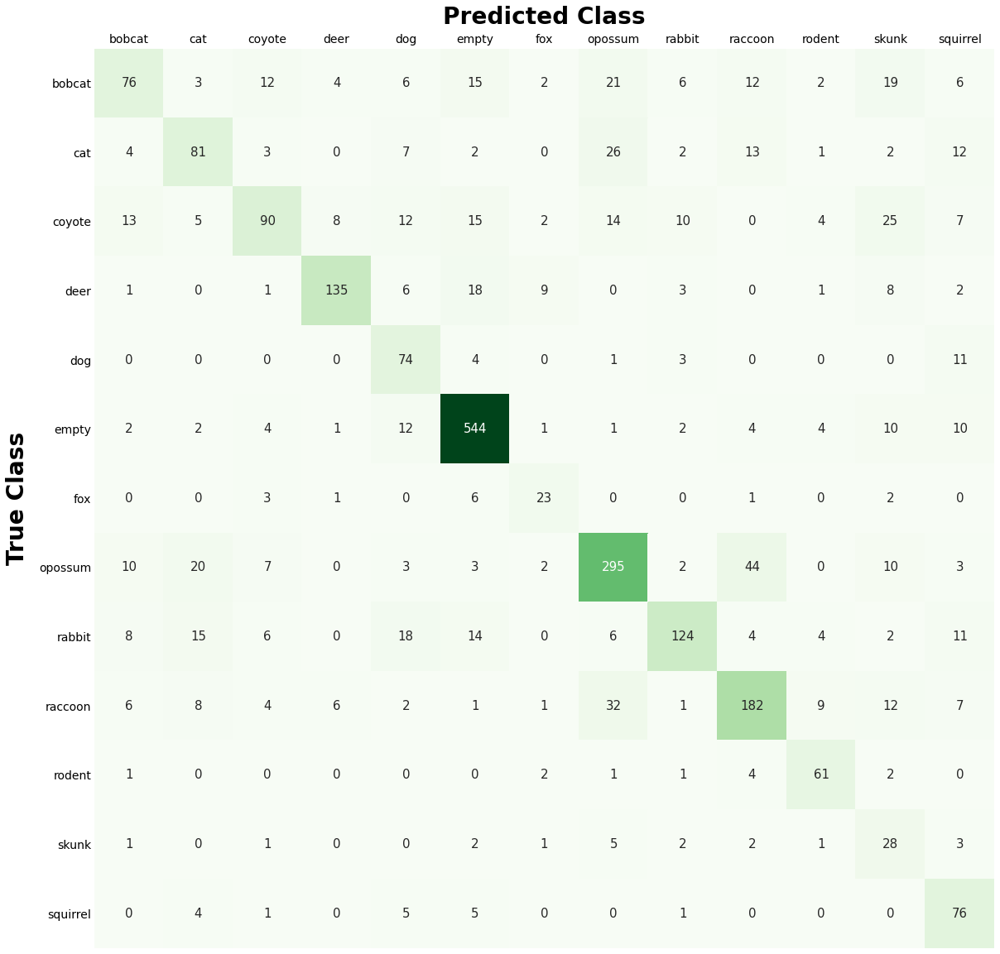

In [66]:
# Initialize figure.
fig, ax = plt.subplots(figsize=(20,20))

# Create a DataFrame with the predictions and true labels.
predictions_df = pd.DataFrame(np.vstack([y_pred, y_true]).T, columns=['predicted_class','true_class'])

# Map thelabels to the class names.
predictions_df['predicted_class'] = predictions_df['predicted_class'].map(label_mapping)
predictions_df['true_class'] = predictions_df['true_class'].map(label_mapping)

# Create the confusion matrix using the DataFrame.
confusion_matrix = pd.crosstab(predictions_df['true_class'],
                               predictions_df['predicted_class'],
                               rownames=['true'],
                               colnames=['predicted'],
                               normalize=False
                              )

# Draw the confusion matrix as a heatmap.
sns.heatmap(confusion_matrix,
            cbar=False,
            annot=True,
            cmap='Greens',
            square=True,
            fmt='d',
            annot_kws={'fontsize': 15}
           )

# Figure formatting.
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.set_xlabel('Predicted Class', size=28, weight='bold', labelpad=12)
ax.set_xticklabels([label for label in ax.get_xticklabels()], size=14)
ax.set_ylabel('True Class',size=28, weight='bold', labelpad=12)
ax.set_yticklabels([label for label in ax.get_yticklabels()], rotation=0, size=14)
ax.tick_params(axis='both', length=0)

# Display figure.
plt.show()
plt.close()

In [67]:
# Get classification report.
print(classification_report(y_true, y_pred, target_names=label_mapping.values()))

              precision    recall  f1-score   support

      bobcat       0.62      0.41      0.50       184
         cat       0.59      0.53      0.56       153
      coyote       0.68      0.44      0.53       205
        deer       0.87      0.73      0.80       184
         dog       0.51      0.80      0.62        93
       empty       0.86      0.91      0.89       597
         fox       0.53      0.64      0.58        36
     opossum       0.73      0.74      0.74       399
      rabbit       0.79      0.58      0.67       212
     raccoon       0.68      0.67      0.68       271
      rodent       0.70      0.85      0.77        72
       skunk       0.23      0.61      0.34        46
    squirrel       0.51      0.83      0.63        92

    accuracy                           0.70      2544
   macro avg       0.64      0.67      0.64      2544
weighted avg       0.72      0.70      0.70      2544



- **Takeaways**

<br>

We can see that our optimized model retains high training accuracy despite slight signs of overfitting. This model also shows approximately 70% test accuracy, as well as 72% weighted average precision and 70% weighted average recall. All in all, while there is still room for improvement, this model presents a quite reasonable performance.

<a class="anchor" id="pre-trained-models"></a>
# Pre-Trained Models
Pre-trained models are usually very deep, complex networks trained on very large datasets. Because the bulk of computational resources and time are spent in the training and tuning processes of creating a model, using a pre-trained model allows access to an architecturally complex model that has already gone through the most expensive steps. Moreover, since these models tend to have very good generalization properties, it is possible to use a pre-trained model created to solve an image recognition task (even if on a different dataset) to solve similar problems. Here we will employ two pre-trained models (VGG16 and ResNet50) that were trained on the ImageNet image dataset. We can take advantage of these pre-trained models in two ways: we can keep all their layers frozen (except for the output layers), which means the models we will apply their previously acquired "knowledge" to our dataset (an example of transfer learning); or we can unfreeze all the layers and train the models on our dataset, taking advantage of the models' optimized architectures.

<a class="anchor" id="vgg16"></a>
## VGG16
VGG16 is a convolutional neural network model with size 3x3 convolution kernels and size 2x2 maxpool kernels. For the ImageNet dataset, this model achieves 92,7% of accuracy.

### Frozen Layers

In [68]:
# Initialize the VGG1 pre-trained model.
vgg16_conv = VGG16(weights='imagenet', include_top=False, input_shape=(64, 64, 3))

In [69]:
# Freeze all of the model's layers.
for layer in vgg16_conv.layers:
    layer.trainable = False
    
# Check the trainable status of each individual layer.
for layer in vgg16_conv.layers:
    print(layer, layer.trainable)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x0000028B57376CC0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B2C7A2080> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B2B1A2DA0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x0000028B2BDF1C50> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B2BDF1550> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B51677FD0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x0000028B2BE40E48> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B2BDE8518> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B2BDE8F98> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B51677748> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x0000028B2BDD37B8> False
<tensorflow.python.

In [70]:
# Adding our fully connected and output layers.
x = Flatten()(vgg16_conv.output)
x = Dense(1000, activation='relu')(x)
prediction = Dense(n_classes, activation='softmax')(x)

In [71]:
# Create a model object.
vgg16_model = Model(inputs=vgg16_conv.input, outputs=prediction)

# Check model properties.
vgg16_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 64, 64, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 64, 64, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 64, 64, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 32, 32, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 32, 32, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 32, 32, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 16, 16, 128)       0   

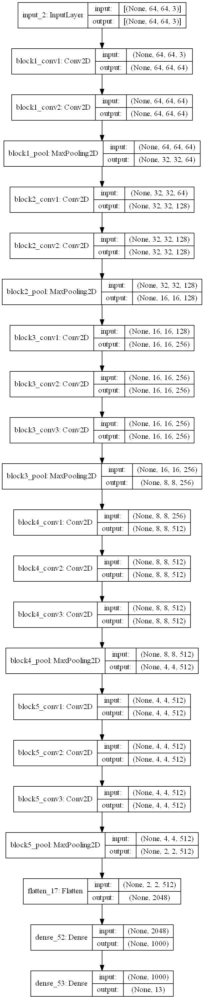

In [72]:
# Show model architecture.
plot_model(vgg16_model, to_file='vgg16_model_arquitecture.png', show_shapes=True, show_layer_names=True, dpi=120)

In [73]:
# Compile the model.
vgg16_model.compile(
                    loss='sparse_categorical_crossentropy',
                    optimizer='adam',
                    metrics=[SparseTopKCategoricalAccuracy(k=1, name='accuracy')]
                   )

In [74]:
model_savename = 'vgg16_model.h5'

# If the model has already been trained, load it, otherwise, train it.
if os.path.exists(os.path.join(os.path.dirname(base_dir), model_savename)):

    # Load the model.
    vgg16_model = load_model(model_savename)
    
    # Load the pickled model history.
    history_dir = os.path.join(os.path.dirname(base_dir), model_savename[:-3] + '_train_history.pickle')
    with open(history_dir, 'rb') as history_file:
        vgg16_model_history = pickle.load(history_file)
    
    # Set the loaded model history.
    vgg16_model.history = vgg16_model_history

else:

    # Train the VGG16 model.
    vgg16_model.fit_generator(
                              train_generator,
                              epochs=n_epochs,
                              validation_data=validation_generator,
                              workers=4
                             )

    # Save the VGG16 model so we don't have to retrain it in the future.
    vgg16_model.save(model_savename)
    
    # Since the "save" method of the model doesn't save the training history, we will pickle it.
    with open(model_savename[:-3] + '_train_history.pickle', 'wb') as history_file:
        pickle.dump(vgg16_model.history.history, history_file)

c:\users\miguel gaspar\desktop\my_virtual_environments\deep_learning_neural_networks\lib\site-packages\tensorflow\python\keras\engine\training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
239/239 [==============================] - 159s 661ms/step - loss: 1.7419 - accuracy: 0.4633 - val_loss: 1.3774 - val_accuracy: 0.5594
Epoch 2/20
239/239 [==============================] - 154s 645ms/step - loss: 1.2369 - accuracy: 0.5893 - val_loss: 1.3300 - val_accuracy: 0.5566
Epoch 3/20
239/239 [==============================] - 156s 651ms/step - loss: 1.0934 - accuracy: 0.6376 - val_loss: 1.2077 - val_accuracy: 0.6105
Epoch 4/20
239/239 [==============================] - 155s 649ms/step - loss: 0.9840 - accuracy: 0.6641 - val_loss: 1.2218 - val_accuracy: 0.5979
Epoch 5/20
239/239 [==============================] - 156s 652ms/step - loss: 0.9224 - accuracy: 0.6920 - val_loss: 1.1731 - val_accuracy: 0.6250
Epoch 6/20
239/239 [==============================] - 156s 650ms/step - loss: 0.8962 - accuracy: 0.7025 - val_loss: 1.1180 - val_accuracy: 0.6395
Epoch 7/20
239/239 [==============================] - 157s 654ms/step - loss: 0.8436 - accuracy: 0.7107 - val_loss: 1.0801 -

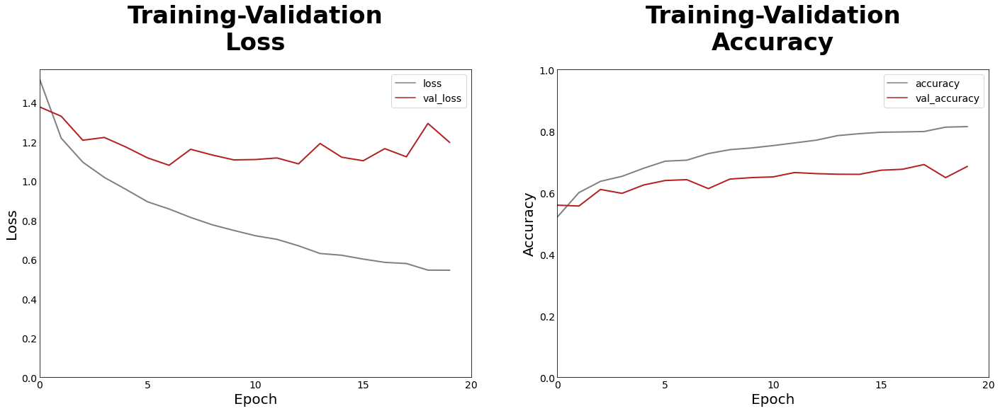

In [75]:
# Check training performance.
plot_model_training_performance(vgg16_model, n_epochs)

In [193]:
# Evaluate VGG16 model against the test set.
vgg16_model.evaluate(test_generator)

80/80 [==============================] - 38s 470ms/step - loss: 1.1621 - accuracy: 0.6867


[1.162137508392334, 0.6867138147354126]

In [76]:
# Create empty arrays to store all model predictions and all true labels.
y_pred = np.array([], dtype=int)
y_true = np.array([], dtype=int)

# Reset the generator after we have looped through it in case we need to run it again.
test_generator.reset()
for _ in range(len(test_generator)):
    
    # Get the next batch of images and associated labels in the generator.
    X_test, y_test = test_generator.next()

    # Get model prediction.
    prediction = np.argmax(vgg16_model.predict(X_test), axis=-1)
    
    # Save prediction and true label.
    y_pred = np.append(y_pred, prediction)
    y_true = np.append(y_true, y_test)

# Check predictions.
y_pred

array([ 2,  7,  7, ..., 10,  7,  7], dtype=int64)

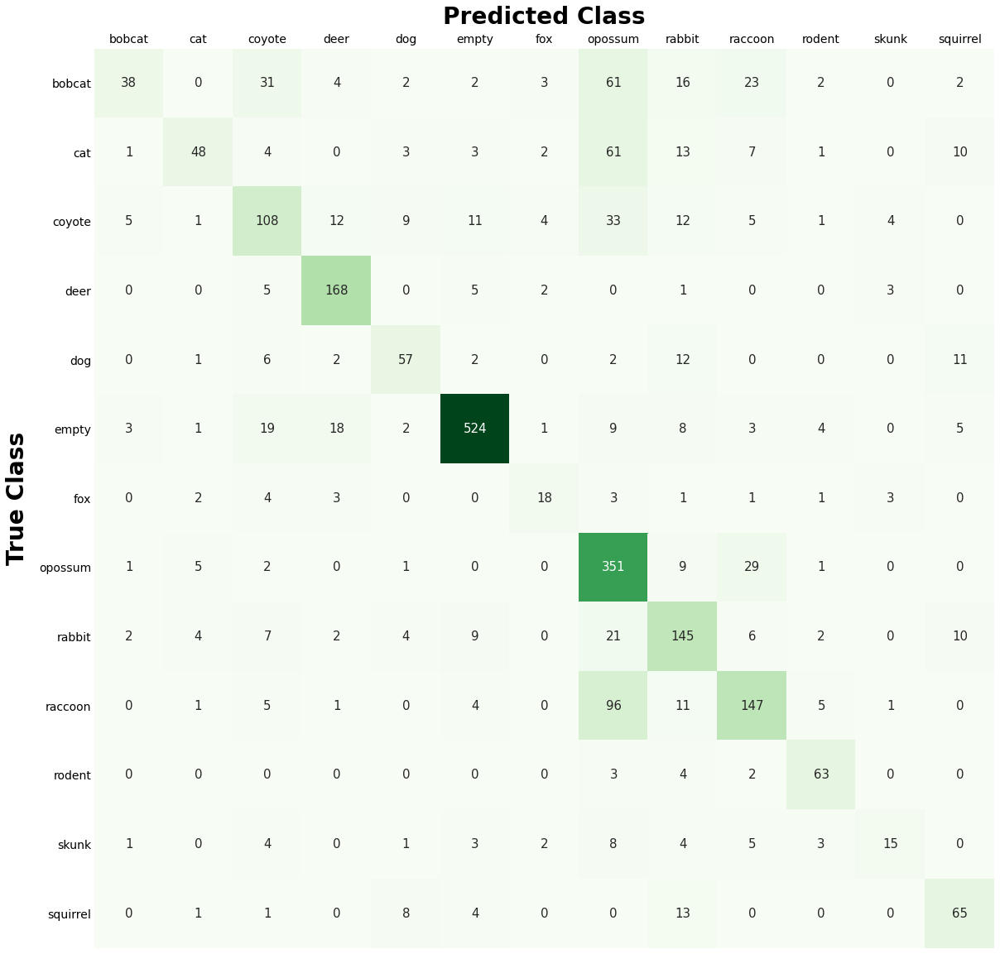

In [77]:
# Initialize figure.
fig, ax = plt.subplots(figsize=(20,20))

# Create a DataFrame with the predictions and true labels.
predictions_df = pd.DataFrame(np.vstack([y_pred, y_true]).T, columns=['predicted_class','true_class'])

# Map thelabels to the class names.
predictions_df['predicted_class'] = predictions_df['predicted_class'].map(label_mapping)
predictions_df['true_class'] = predictions_df['true_class'].map(label_mapping)

# Create the confusion matrix using the DataFrame.
confusion_matrix = pd.crosstab(predictions_df['true_class'],
                               predictions_df['predicted_class'],
                               rownames=['true'],
                               colnames=['predicted'],
                               normalize=False
                              )

# Draw the confusion matrix as a heatmap.
sns.heatmap(confusion_matrix,
            cbar=False,
            annot=True,
            cmap='Greens',
            square=True,
            fmt='d',
            annot_kws={'fontsize': 15}
           )

# Figure formatting.
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.set_xlabel('Predicted Class', size=28, weight='bold', labelpad=12)
ax.set_xticklabels([label for label in ax.get_xticklabels()], size=14)
ax.set_ylabel('True Class',size=28, weight='bold', labelpad=12)
ax.set_yticklabels([label for label in ax.get_yticklabels()], rotation=0, size=14)
ax.tick_params(axis='both', length=0)

# Display figure.
plt.show()
plt.close()

In [78]:
# Get classification report.
print(classification_report(y_true, y_pred, target_names=label_mapping.values()))

              precision    recall  f1-score   support

      bobcat       0.75      0.21      0.32       184
         cat       0.75      0.31      0.44       153
      coyote       0.55      0.53      0.54       205
        deer       0.80      0.91      0.85       184
         dog       0.66      0.61      0.63        93
       empty       0.92      0.88      0.90       597
         fox       0.56      0.50      0.53        36
     opossum       0.54      0.88      0.67       399
      rabbit       0.58      0.68      0.63       212
     raccoon       0.64      0.54      0.59       271
      rodent       0.76      0.88      0.81        72
       skunk       0.58      0.33      0.42        46
    squirrel       0.63      0.71      0.67        92

    accuracy                           0.69      2544
   macro avg       0.67      0.61      0.62      2544
weighted avg       0.71      0.69      0.67      2544



### Unfrozen Layers

In [80]:
model_savename = 'unfrozen_vgg16_model.h5'

# If the model has already been trained, load it, otherwise, train it.
if os.path.exists(os.path.join(os.path.dirname(base_dir), model_savename)):

    # Load the model.
    vgg16_model = load_model(model_savename)
    
    # Load the pickled model history.
    history_dir = os.path.join(os.path.dirname(base_dir), model_savename[:-3] + '_train_history.pickle')
    with open(history_dir, 'rb') as history_file:
        vgg16_model_history = pickle.load(history_file)
    
    # Set the loaded model history.
    vgg16_model.history = vgg16_model_history

else:

    # Unfreeze all the layers.
    for layer in vgg16_model.layers:
        layer.trainable = True

    # Compile the model.
    vgg16_model.compile(optimizer=Adam(1e-5),  # Very low learning rate.
                        loss='sparse_categorical_crossentropy',
                        metrics=[SparseTopKCategoricalAccuracy(k=1, name='accuracy')]
                       )

    # Train the tuned VGG16 model.
    vgg16_model.fit_generator(
                              train_generator,
                              epochs=n_epochs,
                              validation_data=validation_generator,
                              workers=4
                             )

    # Save the tuned VGG16 model so we don't have to retrain it in the future.
    vgg16_model.save(model_savename)
    
    # Since the "save" method of the model doesn't save the training history, we will pickle it.
    with open(model_savename[:-3] + '_train_history.pickle', 'wb') as history_file:
        pickle.dump(vgg16_model.history.history, history_file)

Epoch 1/20
239/239 [==============================] - 533s 2s/step - loss: 0.5576 - accuracy: 0.8103 - val_loss: 1.1905 - val_accuracy: 0.6769
Epoch 2/20
239/239 [==============================] - 531s 2s/step - loss: 0.4768 - accuracy: 0.8306 - val_loss: 1.1778 - val_accuracy: 0.6926
Epoch 3/20
239/239 [==============================] - 509s 2s/step - loss: 0.4515 - accuracy: 0.8400 - val_loss: 1.1984 - val_accuracy: 0.6969
Epoch 4/20
239/239 [==============================] - 504s 2s/step - loss: 0.4119 - accuracy: 0.8584 - val_loss: 1.2300 - val_accuracy: 0.6918
Epoch 5/20
239/239 [==============================] - 504s 2s/step - loss: 0.3708 - accuracy: 0.8695 - val_loss: 1.1587 - val_accuracy: 0.7138
Epoch 6/20
239/239 [==============================] - 503s 2s/step - loss: 0.3523 - accuracy: 0.8727 - val_loss: 1.2594 - val_accuracy: 0.7075
Epoch 7/20
239/239 [==============================] - 504s 2s/step - loss: 0.3532 - accuracy: 0.8788 - val_loss: 1.1569 - val_accuracy: 0.7170

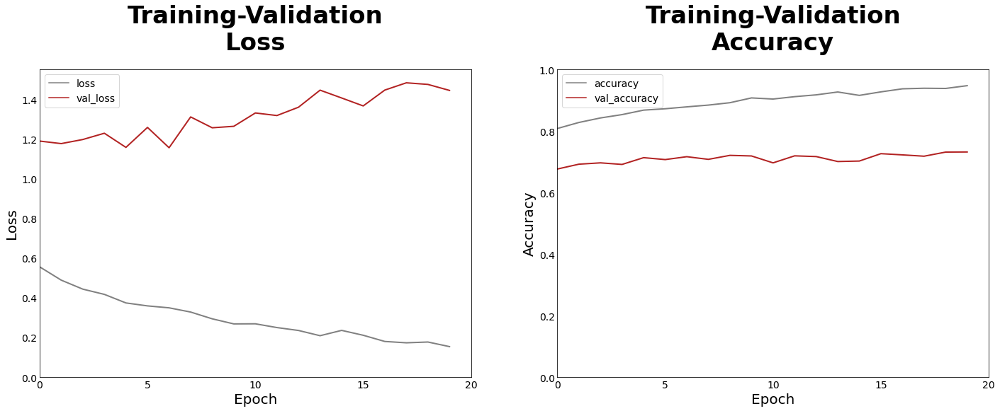

In [81]:
# Check training performance.
plot_model_training_performance(vgg16_model, n_epochs)

In [194]:
# Evaluate VGG16 model against the test set.
vgg16_model.evaluate(test_generator)

80/80 [==============================] - 39s 483ms/step - loss: 1.4012 - accuracy: 0.7217


[1.4012030363082886, 0.7216981053352356]

In [82]:
# Create empty arrays to store all model predictions and all true labels.
y_pred = np.array([], dtype=int)
y_true = np.array([], dtype=int)

# Reset the generator after we have looped through it in case we need to run it again.
test_generator.reset()
for _ in range(len(test_generator)):
    
    # Get the next batch of images and associated labels in the generator.
    X_test, y_test = test_generator.next()

    # Get model prediction.
    prediction = np.argmax(vgg16_model.predict(X_test), axis=-1)
    
    # Save prediction and true label.
    y_pred = np.append(y_pred, prediction)
    y_true = np.append(y_true, y_test)

# Check predictions.
y_pred

array([ 1,  0,  5, ..., 12,  7,  0], dtype=int64)

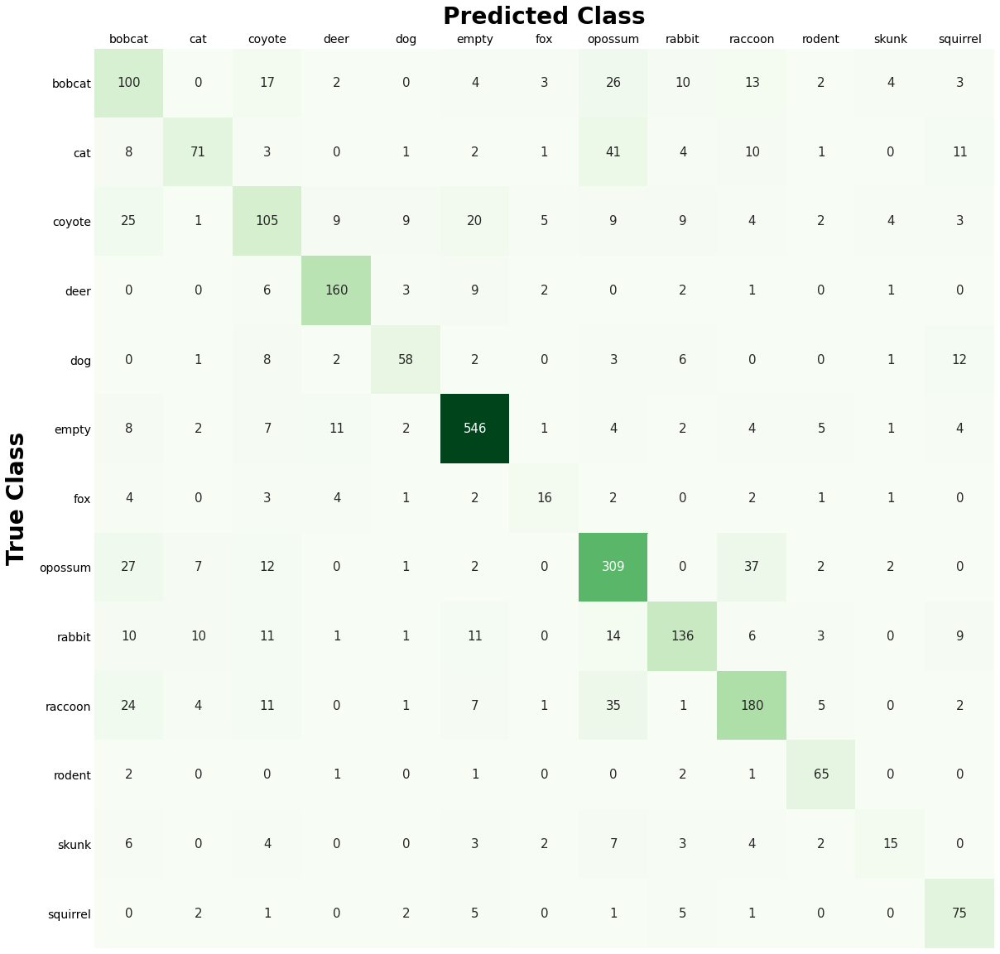

In [83]:
# Initialize figure.
fig, ax = plt.subplots(figsize=(20,20))

# Create a DataFrame with the predictions and true labels.
predictions_df = pd.DataFrame(np.vstack([y_pred, y_true]).T, columns=['predicted_class','true_class'])

# Map thelabels to the class names.
predictions_df['predicted_class'] = predictions_df['predicted_class'].map(label_mapping)
predictions_df['true_class'] = predictions_df['true_class'].map(label_mapping)

# Create the confusion matrix using the DataFrame.
confusion_matrix = pd.crosstab(predictions_df['true_class'],
                               predictions_df['predicted_class'],
                               rownames=['true'],
                               colnames=['predicted'],
                               normalize=False
                              )

# Draw the confusion matrix as a heatmap.
sns.heatmap(confusion_matrix,
            cbar=False,
            annot=True,
            cmap='Greens',
            square=True,
            fmt='d',
            annot_kws={'fontsize': 15}
           )

# Figure formatting.
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.set_xlabel('Predicted Class', size=28, weight='bold', labelpad=12)
ax.set_xticklabels([label for label in ax.get_xticklabels()], size=14)
ax.set_ylabel('True Class',size=28, weight='bold', labelpad=12)
ax.set_yticklabels([label for label in ax.get_yticklabels()], rotation=0, size=14)
ax.tick_params(axis='both', length=0)

# Display figure.
plt.show()
plt.close()

In [84]:
# Get classification report.
print(classification_report(y_true, y_pred, target_names=label_mapping.values()))

              precision    recall  f1-score   support

      bobcat       0.47      0.54      0.50       184
         cat       0.72      0.46      0.57       153
      coyote       0.56      0.51      0.53       205
        deer       0.84      0.87      0.86       184
         dog       0.73      0.62      0.67        93
       empty       0.89      0.91      0.90       597
         fox       0.52      0.44      0.48        36
     opossum       0.69      0.77      0.73       399
      rabbit       0.76      0.64      0.69       212
     raccoon       0.68      0.66      0.67       271
      rodent       0.74      0.90      0.81        72
       skunk       0.52      0.33      0.40        46
    squirrel       0.63      0.82      0.71        92

    accuracy                           0.72      2544
   macro avg       0.67      0.65      0.66      2544
weighted avg       0.72      0.72      0.72      2544



<a class="anchor" id="resnet50"></a>
## ResNet50
ResNet-50 is a convolutional neural network that is 50 layers deep, and trained on more than a million images from the ImageNet database. This pre-trained network can classify images into 1000 object categories, including many animals.

### Frozen Layers

In [85]:
# Initialize the Resnet50 pre-trained model.
resnet50 = ResNet50(weights='imagenet', include_top=False, input_shape=(64, 64, 3))

In [86]:
# Freeze all of the model's layers.
for layer in resnet50.layers:
    layer.trainable = False
    
# Check the trainable status of each individual layer.
for layer in resnet50.layers:
    print(layer, layer.trainable)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x0000028B56FF6940> False
<tensorflow.python.keras.layers.convolutional.ZeroPadding2D object at 0x0000028B56D88B38> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B56FF66D8> False
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x0000028B2114ADA0> False
<tensorflow.python.keras.layers.core.Activation object at 0x0000028B0BD54E80> False
<tensorflow.python.keras.layers.convolutional.ZeroPadding2D object at 0x0000028B56FD8AC8> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x0000028B56FF4160> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B56FF46D8> False
<tensorflow.python.keras.layers.normalization_v2.BatchNormalization object at 0x0000028B56DDFDA0> False
<tensorflow.python.keras.layers.core.Activation object at 0x0000028B56F76B00> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x0000028B2

In [87]:
# Adding our fully connected and output layers.
x = Flatten()(resnet50.output)
x = Dense(1000, activation='relu')(x)
prediction = Dense(n_classes, activation='softmax')(x)

In [88]:
# Create a model object.
resnet50_model = Model(inputs=resnet50.input, outputs=prediction)

# Check model properties.
resnet50_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 70, 70, 3)    0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 32, 32, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 32, 32, 64)   256         conv1_conv[0][0]                 
____________________________________________________________________________________________

__________________________________________________________________________________________________
conv4_block4_2_conv (Conv2D)    (None, 4, 4, 256)    590080      conv4_block4_1_relu[0][0]        
__________________________________________________________________________________________________
conv4_block4_2_bn (BatchNormali (None, 4, 4, 256)    1024        conv4_block4_2_conv[0][0]        
__________________________________________________________________________________________________
conv4_block4_2_relu (Activation (None, 4, 4, 256)    0           conv4_block4_2_bn[0][0]          
__________________________________________________________________________________________________
conv4_block4_3_conv (Conv2D)    (None, 4, 4, 1024)   263168      conv4_block4_2_relu[0][0]        
__________________________________________________________________________________________________
conv4_block4_3_bn (BatchNormali (None, 4, 4, 1024)   4096        conv4_block4_3_conv[0][0]        
__________

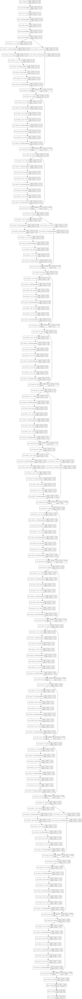

In [89]:
# Show model architecture.
plot_model(resnet50_model, to_file='resnet50_model_arquitecture.png', show_shapes=True, show_layer_names=True, dpi=120)

In [90]:
# Compile the model.
resnet50_model.compile(
                       loss='sparse_categorical_crossentropy',
                       optimizer='adam',
                       metrics=[SparseTopKCategoricalAccuracy(k=1, name='accuracy')]
                      )

In [91]:
model_savename = 'resnet50_model.h5'

# If the model has already been trained, load it, otherwise, train it.
if os.path.exists(os.path.join(os.path.dirname(base_dir), model_savename)):

    # Load the model.
    resnet50_model = load_model(model_savename)
    
    # Load the pickled model history.
    history_dir = os.path.join(os.path.dirname(base_dir), model_savename[:-3] + '_train_history.pickle')
    with open(history_dir, 'rb') as history_file:
        resnet50_model_history = pickle.load(history_file)
    
    # Set the loaded model history.
    resnet50_model.history = resnet50_model_history

else:

    # Train the ResNet50 model.
    resnet50_model.fit_generator(
                                 train_generator,
                                 epochs=n_epochs,
                                 validation_data=validation_generator,
                                 workers=4
                                )

    # Save the ResNet50 model so we don't have to retrain it in the future.
    resnet50_model.save(model_savename)
    
    # Since the "save" method of the model doesn't save the training history, we will pickle it.
    with open(model_savename[:-3] + '_train_history.pickle', 'wb') as history_file:
        pickle.dump(resnet50_model.history.history, history_file)

c:\users\miguel gaspar\desktop\my_virtual_environments\deep_learning_neural_networks\lib\site-packages\tensorflow\python\keras\engine\training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
239/239 [==============================] - 84s 339ms/step - loss: 2.2593 - accuracy: 0.3033 - val_loss: 1.9200 - val_accuracy: 0.3899
Epoch 2/20
239/239 [==============================] - 81s 337ms/step - loss: 1.8407 - accuracy: 0.3941 - val_loss: 1.8098 - val_accuracy: 0.4233
Epoch 3/20
239/239 [==============================] - 81s 338ms/step - loss: 1.7358 - accuracy: 0.4399 - val_loss: 1.7811 - val_accuracy: 0.4355
Epoch 4/20
239/239 [==============================] - 81s 339ms/step - loss: 1.7363 - accuracy: 0.4374 - val_loss: 1.7544 - val_accuracy: 0.4175
Epoch 5/20
239/239 [==============================] - 81s 338ms/step - loss: 1.6749 - accuracy: 0.4495 - val_loss: 1.6779 - val_accuracy: 0.4642
Epoch 6/20
239/239 [==============================] - 81s 339ms/step - loss: 1.6441 - accuracy: 0.4620 - val_loss: 1.6536 - val_accuracy: 0.4689
Epoch 7/20
239/239 [==============================] - 81s 339ms/step - loss: 1.6234 - accuracy: 0.4613 - val_loss: 1.6261 - val_ac

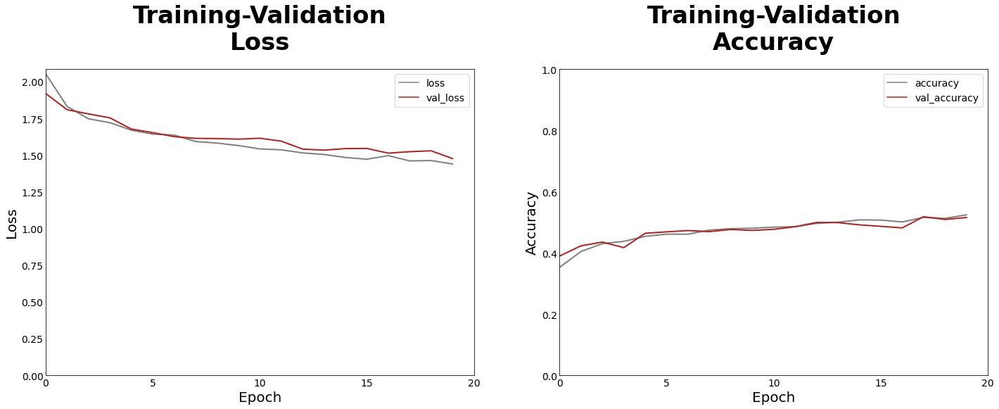

In [92]:
# Check training performance.
plot_model_training_performance(resnet50_model, n_epochs)

In [195]:
# Evaluate ResNet50 model against the test set.
resnet50_model.evaluate(test_generator)

80/80 [==============================] - 23s 275ms/step - loss: 1.4649 - accuracy: 0.5200


[1.4649096727371216, 0.5200471878051758]

In [93]:
# Create empty arrays to store all model predictions and all true labels.
y_pred = np.array([], dtype=int)
y_true = np.array([], dtype=int)

# Reset the generator after we have looped through it in case we need to run it again.
test_generator.reset()
for _ in range(len(test_generator)):
    
    # Get the next batch of images and associated labels in the generator.
    X_test, y_test = test_generator.next()

    # Get model prediction.
    prediction = np.argmax(resnet50_model.predict(X_test), axis=-1)
    
    # Save prediction and true label.
    y_pred = np.append(y_pred, prediction)
    y_true = np.append(y_true, y_test)

# Check predictions.
y_pred

array([ 5, 12,  7, ...,  7,  5,  9], dtype=int64)

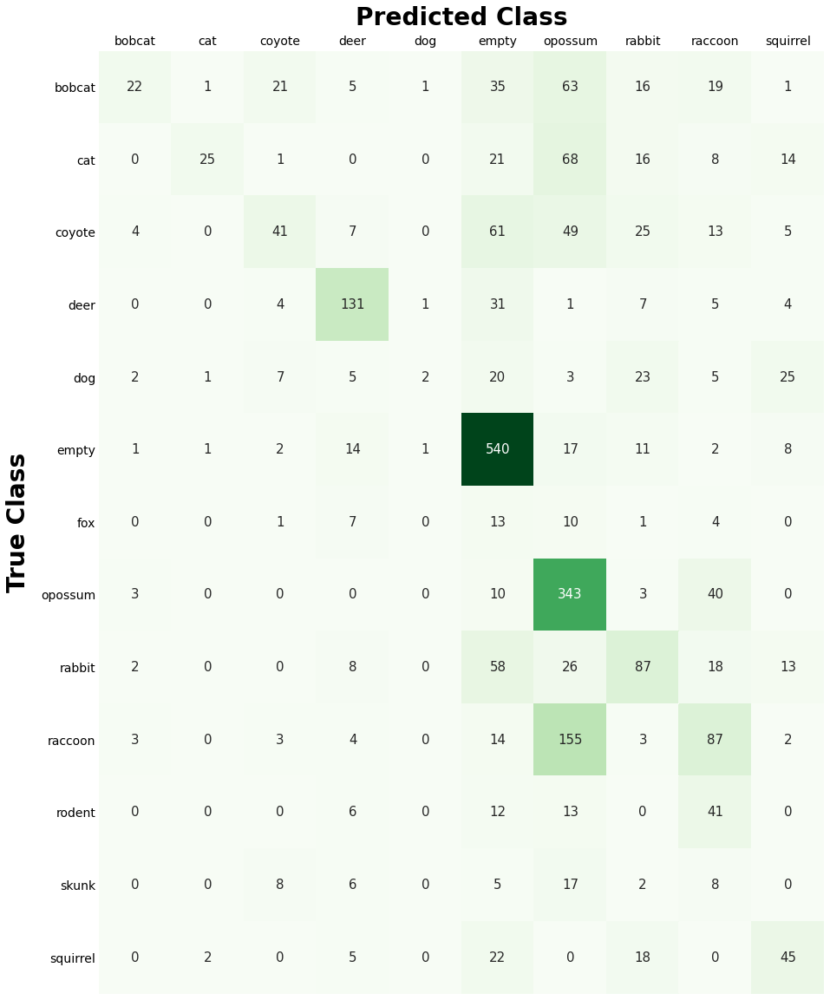

In [94]:
# Initialize figure.
fig, ax = plt.subplots(figsize=(20,20))

# Create a DataFrame with the predictions and true labels.
predictions_df = pd.DataFrame(np.vstack([y_pred, y_true]).T, columns=['predicted_class','true_class'])

# Map thelabels to the class names.
predictions_df['predicted_class'] = predictions_df['predicted_class'].map(label_mapping)
predictions_df['true_class'] = predictions_df['true_class'].map(label_mapping)

# Create the confusion matrix using the DataFrame.
confusion_matrix = pd.crosstab(predictions_df['true_class'],
                               predictions_df['predicted_class'],
                               rownames=['true'],
                               colnames=['predicted'],
                               normalize=False
                              )

# Draw the confusion matrix as a heatmap.
sns.heatmap(confusion_matrix,
            cbar=False,
            annot=True,
            cmap='Greens',
            square=True,
            fmt='d',
            annot_kws={'fontsize': 15}
           )

# Figure formatting.
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.set_xlabel('Predicted Class', size=28, weight='bold', labelpad=12)
ax.set_xticklabels([label for label in ax.get_xticklabels()], size=14)
ax.set_ylabel('True Class',size=28, weight='bold', labelpad=12)
ax.set_yticklabels([label for label in ax.get_yticklabels()], rotation=0, size=14)
ax.tick_params(axis='both', length=0)

# Display figure.
plt.show()
plt.close()

In [95]:
# Get classification report.
print(classification_report(y_true, y_pred, target_names=label_mapping.values()))

              precision    recall  f1-score   support

      bobcat       0.59      0.12      0.20       184
         cat       0.83      0.16      0.27       153
      coyote       0.47      0.20      0.28       205
        deer       0.66      0.71      0.69       184
         dog       0.40      0.02      0.04        93
       empty       0.64      0.90      0.75       597
         fox       0.00      0.00      0.00        36
     opossum       0.45      0.86      0.59       399
      rabbit       0.41      0.41      0.41       212
     raccoon       0.35      0.32      0.33       271
      rodent       0.00      0.00      0.00        72
       skunk       0.00      0.00      0.00        46
    squirrel       0.38      0.49      0.43        92

    accuracy                           0.52      2544
   macro avg       0.40      0.32      0.31      2544
weighted avg       0.50      0.52      0.46      2544



c:\users\miguel gaspar\desktop\my_virtual_environments\deep_learning_neural_networks\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\miguel gaspar\desktop\my_virtual_environments\deep_learning_neural_networks\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\miguel gaspar\desktop\my_virtual_environments\deep_learning_neural_networks\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predi

### Unfrozen Layers

In [96]:
model_savename = 'unfrozen_inceptionv3_model.h5'

# If the model has already been trained, load it, otherwise, train it.
if os.path.exists(os.path.join(os.path.dirname(base_dir), model_savename)):

    # Load the model.
    inceptionv3_model = load_model(model_savename)
    
    # Load the pickled model history.
    history_dir = os.path.join(os.path.dirname(base_dir), model_savename[:-3] + '_train_history.pickle')
    with open(history_dir, 'rb') as history_file:
        inceptionv3_model_history = pickle.load(history_file)
    
    # Set the loaded model history.
    inceptionv3_model.history = inceptionv3_model_history

else:

    # Unfreeze all the layers.
    for layer in resnet50_model.layers:
        layer.trainable = True

    # Compile the model.
    resnet50_model.compile(optimizer=Adam(1e-5),  # Very low learning rate.
                           loss='sparse_categorical_crossentropy',
                           metrics=[SparseTopKCategoricalAccuracy(k=1, name='accuracy')]
                          )

    # Train the tuned ResNet50 model.
    resnet50_model.fit_generator(
                                 train_generator,
                                 epochs=n_epochs,
                                 validation_data=validation_generator,
                                 workers=4
                                )

    # Save the tuned ResNet50 model so we don't have to retrain it in the future.
    resnet50_model.save(model_savename)
    
    # Since the "save" method of the model doesn't save the training history, we will pickle it.
    with open(model_savename[:-3] + '_train_history.pickle', 'wb') as history_file:
        pickle.dump(resnet50_model.history.history, history_file)

c:\users\miguel gaspar\desktop\my_virtual_environments\deep_learning_neural_networks\lib\site-packages\tensorflow\python\keras\engine\training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
239/239 [==============================] - 458s 2s/step - loss: 17.5966 - accuracy: 0.2274 - val_loss: 947.2123 - val_accuracy: 0.0759
Epoch 2/20
239/239 [==============================] - 456s 2s/step - loss: 4.3671 - accuracy: 0.4133 - val_loss: 2081.2014 - val_accuracy: 0.1623
Epoch 3/20
239/239 [==============================] - 456s 2s/step - loss: 2.4492 - accuracy: 0.5027 - val_loss: 924.8265 - val_accuracy: 0.1517
Epoch 4/20
239/239 [==============================] - 458s 2s/step - loss: 1.7559 - accuracy: 0.5635 - val_loss: 120.5773 - val_accuracy: 0.2618
Epoch 5/20
239/239 [==============================] - 453s 2s/step - loss: 1.3563 - accuracy: 0.6088 - val_loss: 8.5747 - val_accuracy: 0.5090
Epoch 6/20
239/239 [==============================] - 455s 2s/step - loss: 1.1599 - accuracy: 0.6578 - val_loss: 6.3014 - val_accuracy: 0.5594
Epoch 7/20
239/239 [==============================] - 453s 2s/step - loss: 0.9743 - accuracy: 0.6864 - val_loss: 6.4444 - val_accura

NameError: name 'inceptionv3_model' is not defined

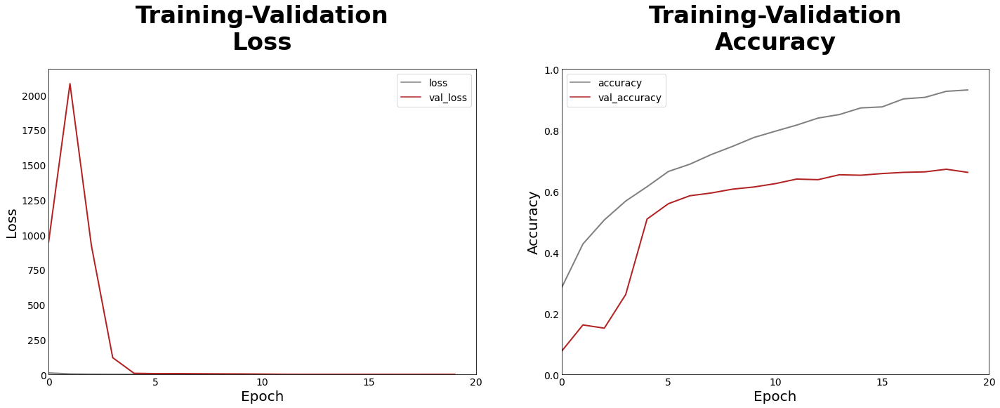

In [102]:
# Check training performance.
plot_model_training_performance(resnet50_model, n_epochs)

In [197]:
# Evaluate ResNet50 model against the test set.
resnet50_model.evaluate(test_generator)

80/80 [==============================] - 23s 271ms/step - loss: 1.4649 - accuracy: 0.5200


[1.4649096727371216, 0.5200471878051758]

In [103]:
# Create empty arrays to store all model predictions and all true labels.
y_pred = np.array([], dtype=int)
y_true = np.array([], dtype=int)

# Reset the generator after we have looped through it in case we need to run it again.
test_generator.reset()
for _ in range(len(test_generator)):
    
    # Get the next batch of images and associated labels in the generator.
    X_test, y_test = test_generator.next()

    # Get model prediction.
    prediction = np.argmax(resnet50_model.predict(X_test), axis=-1)
    
    # Save prediction and true label.
    y_pred = np.append(y_pred, prediction)
    y_true = np.append(y_true, y_test)

# Check predictions.
y_pred

array([ 8, 12,  0, ...,  7,  7,  5], dtype=int64)

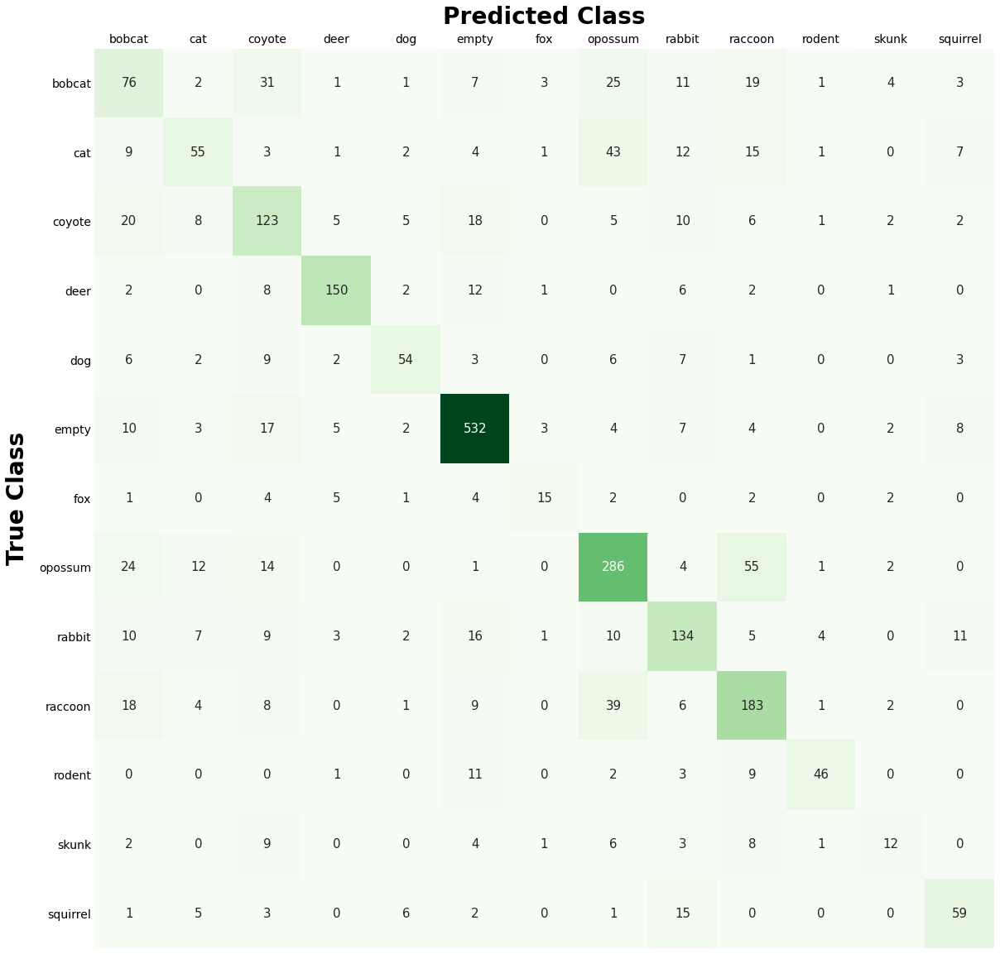

In [104]:
# Initialize figure.
fig, ax = plt.subplots(figsize=(20,20))

# Create a DataFrame with the predictions and true labels.
predictions_df = pd.DataFrame(np.vstack([y_pred, y_true]).T, columns=['predicted_class','true_class'])

# Map thelabels to the class names.
predictions_df['predicted_class'] = predictions_df['predicted_class'].map(label_mapping)
predictions_df['true_class'] = predictions_df['true_class'].map(label_mapping)

# Create the confusion matrix using the DataFrame.
confusion_matrix = pd.crosstab(predictions_df['true_class'],
                               predictions_df['predicted_class'],
                               rownames=['true'],
                               colnames=['predicted'],
                               normalize=False
                              )

# Draw the confusion matrix as a heatmap.
sns.heatmap(confusion_matrix,
            cbar=False,
            annot=True,
            cmap='Greens',
            square=True,
            fmt='d',
            annot_kws={'fontsize': 15}
           )

# Figure formatting.
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.set_xlabel('Predicted Class', size=28, weight='bold', labelpad=12)
ax.set_xticklabels([label for label in ax.get_xticklabels()], size=14)
ax.set_ylabel('True Class',size=28, weight='bold', labelpad=12)
ax.set_yticklabels([label for label in ax.get_yticklabels()], rotation=0, size=14)
ax.tick_params(axis='both', length=0)

# Display figure.
plt.show()
plt.close()

In [105]:
# Get classification report.
print(classification_report(y_true, y_pred, target_names=label_mapping.values()))

              precision    recall  f1-score   support

      bobcat       0.42      0.41      0.42       184
         cat       0.56      0.36      0.44       153
      coyote       0.52      0.60      0.56       205
        deer       0.87      0.82      0.84       184
         dog       0.71      0.58      0.64        93
       empty       0.85      0.89      0.87       597
         fox       0.60      0.42      0.49        36
     opossum       0.67      0.72      0.69       399
      rabbit       0.61      0.63      0.62       212
     raccoon       0.59      0.68      0.63       271
      rodent       0.82      0.64      0.72        72
       skunk       0.44      0.26      0.33        46
    squirrel       0.63      0.64      0.64        92

    accuracy                           0.68      2544
   macro avg       0.64      0.59      0.61      2544
weighted avg       0.68      0.68      0.67      2544



- **Takeaways**

<br>

From the two pre-trained models, we can see that VGG16 performed significantly better than ResNet50. Unfreezing the layers did not confer any benefit to either network, instead exacerbating the effects of overfitting. While frozen ResNet50 shows no overfitting, it does suffer from low accuracy; on the other hand, VGG16 shows reasonably accuracy, althouh accompanied by some overfitting.

<a class="anchor" id="ensemle-model"></a>
# Ensemble Model
Most of the times, only one CNN model is applied. However, it has been showed that an ensemble learning approach, applying a set of CNN models on the same task, could brings better results. Initially, each CNN model is trained sequentially and then, on the test data, each model makes its prediction. The final result of the ensemble model will correspond to the prediction which occurred more frequently. Here, instead of creating another set of models to use in the ensemble, we will aggregate the models that have already been trained (Baseline Model, and both pre-trained models).

In [163]:
# Load all models we want to include in the ensemble.
model1 = load_model('baseline_model_with_class_weights.h5')
model2 = load_model('vgg16_model.h5')
model3 = load_model('resnet50_model.h5')

ensemble_models = [model1, model2, model3]

# Create empty arrays to store all model predictions and all true labels.
y_pred = np.array([], dtype=int)
y_true = np.array([], dtype=int)

# Reset the generator after we have looped through it in case we need to run it again.
test_generator.reset()
for _ in range(len(test_generator)):
    
    # Get the next batch of images and associated labels in the generator.
    X_test, y_test = test_generator.next()

    # Get model predictions.
    ensemble_predictions = generate_ensemble_predictions(ensemble_models, X_test)
    
    # Save prediction and true label.
    y_pred = np.append(y_pred, ensemble_predictions)
    y_true = np.append(y_true, y_test)

# Check predictions.
y_pred

array([3, 8, 7, ..., 7, 7, 9], dtype=int64)

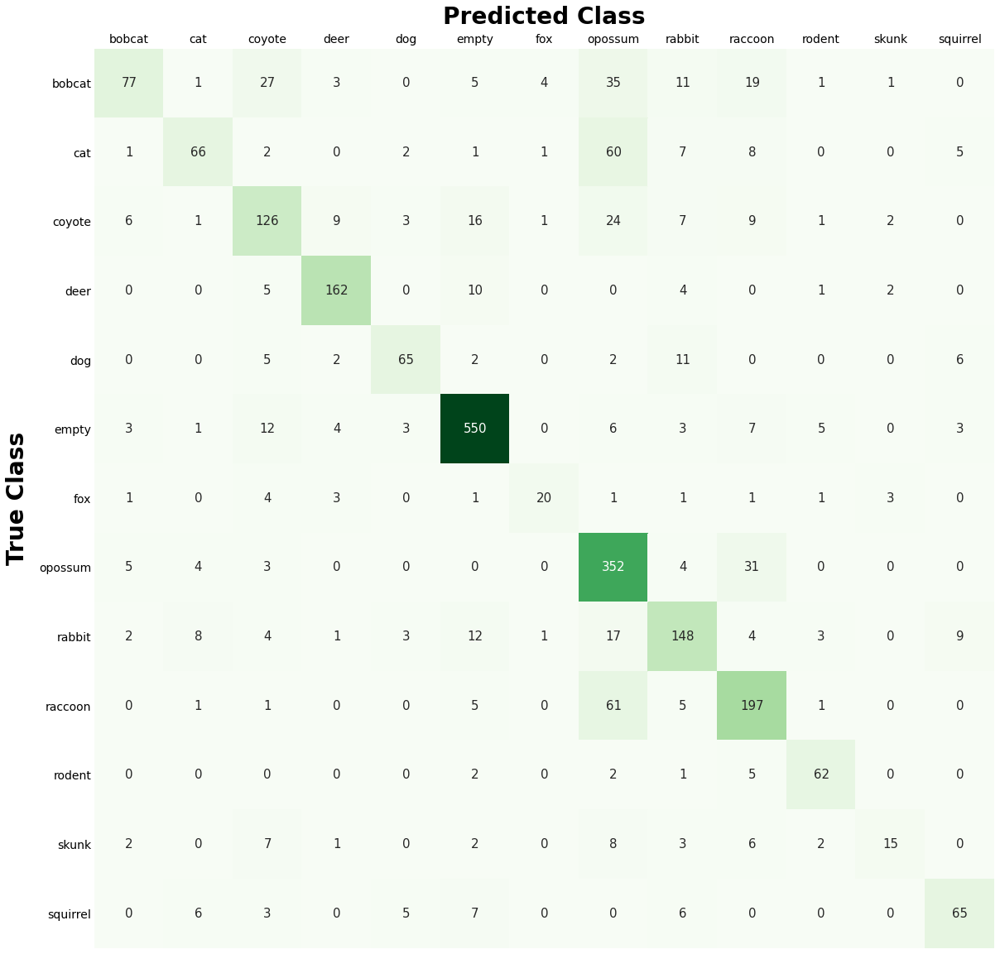

In [164]:
# Initialize figure.
fig, ax = plt.subplots(figsize=(20,20))

# Create a DataFrame with the predictions and true labels.
predictions_df = pd.DataFrame(np.vstack([y_pred, y_true]).T, columns=['predicted_class','true_class'])

# Map thelabels to the class names.
predictions_df['predicted_class'] = predictions_df['predicted_class'].map(label_mapping)
predictions_df['true_class'] = predictions_df['true_class'].map(label_mapping)

# Create the confusion matrix using the DataFrame.
confusion_matrix = pd.crosstab(predictions_df['true_class'],
                               predictions_df['predicted_class'],
                               rownames=['true'],
                               colnames=['predicted'],
                               normalize=False
                              )

# Draw the confusion matrix as a heatmap.
sns.heatmap(confusion_matrix,
            cbar=False,
            annot=True,
            cmap='Greens',
            square=True,
            fmt='d',
            annot_kws={'fontsize': 15}
           )

# Figure formatting.
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.set_xlabel('Predicted Class', size=28, weight='bold', labelpad=12)
ax.set_xticklabels([label for label in ax.get_xticklabels()], size=14)
ax.set_ylabel('True Class',size=28, weight='bold', labelpad=12)
ax.set_yticklabels([label for label in ax.get_yticklabels()], rotation=0, size=14)
ax.tick_params(axis='both', length=0)

# Display figure.
plt.show()
plt.close()

In [165]:
# Get classification report.
print(classification_report(y_true, y_pred, target_names=label_mapping.values()))

              precision    recall  f1-score   support

      bobcat       0.79      0.42      0.55       184
         cat       0.75      0.43      0.55       153
      coyote       0.63      0.61      0.62       205
        deer       0.88      0.88      0.88       184
         dog       0.80      0.70      0.75        93
       empty       0.90      0.92      0.91       597
         fox       0.74      0.56      0.63        36
     opossum       0.62      0.88      0.73       399
      rabbit       0.70      0.70      0.70       212
     raccoon       0.69      0.73      0.71       271
      rodent       0.81      0.86      0.83        72
       skunk       0.65      0.33      0.43        46
    squirrel       0.74      0.71      0.72        92

    accuracy                           0.75      2544
   macro avg       0.75      0.67      0.69      2544
weighted avg       0.76      0.75      0.74      2544



- **Takeaways**

<br>

We can see that integrating the output of several models into an ensemble yields more robust results, as seen by the increased weighted average precision and recall.

<a class="anchor" id="classification-visualizer"></a>
# Classification Visualizer
Here we can sample random images from the test set and visualize those images with their associated labels, as well as the label predictions for each of the models presented throughout this project. The cell below can be run indefinitely to generate a new image and set of label predictions at each cell run.

True Class:                              raccoon 

Predicted Class by Baseline Model:       raccoon
Predicted Class by VGG16 Model:          squirrel
Predicted Class by ResNet50 Model:       deer
Predicted Class by Ensemble_Model:       raccoon


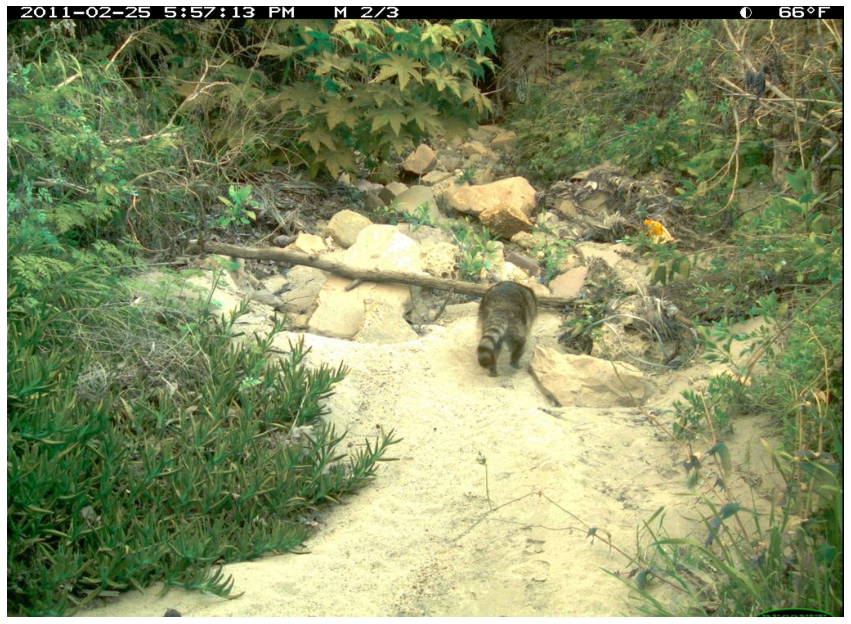

In [190]:
# Select a random sample from the test set.
sample = test_set.sample(n=1)

# Initialize figure.
fig, ax = plt.subplots(figsize=(15,15))

# Turn off all axes.
plt.axis('off')

# Read and display the selected image.
img = cv2.imread(os.path.join(base_dir, sample['file_name'].values[0]))
plt.imshow(img)

# Resize and expand the selected image.
img = cv2.resize(img, (64,64))
img = np.expand_dims(img, axis=0)

# Get image class prediction for Tuned Model.
pred1 = np.argmax(model1.predict(img), axis=-1)[0]
pred1_label = label_mapping[pred1]

# Get image class prediction for VGG16 Model.
pred2 = np.argmax(model2.predict(img), axis=-1)[0]
pred2_label = label_mapping[pred2]

# Get image class prediction for ResNet50 Model.
pred3 = np.argmax(model3.predict(img), axis=-1)[0]
pred3_label = label_mapping[pred3]

# Get image class prediction for Ensemble Model.
ensemble_pred = generate_ensemble_predictions(ensemble_models, img)[0]
ensemble_pred_label = label_mapping[ensemble_pred]

# Print results.
print('True Class:                             ', sample['class_label'].values[0], '\n')
print('Predicted Class by Baseline Model:      ', pred1_label)
print('Predicted Class by VGG16 Model:         ', pred2_label)
print('Predicted Class by ResNet50 Model:      ', pred3_label)
print('Predicted Class by Ensemble_Model:      ', ensemble_pred_label)

<a class="anchor" id="conclusion"></a>
# Conclusion

In conclusion, we have seen that not only do different input optimizations, but hyperparameters, model architecture, and ensemble aggregation can help develop neural networks that are tuned to the problem at hand. In this project we have explored the effects of hyperparameter tuning and input optimization, using pre-trained models, and ensemble aggregation. We have found that, compared to baseline, the best performing approach is the ensemble model, which takes majority vote to output any given classification.
<br>

Given more time and computational resources, the models presented in this project could have been improved by means of several options: usage of the entire original dataset, therefore giving more examples to the models; increased number of epochs, which would let the models train more and perhaps make validation and training metrics converge more over time, which in turn would diminish the effects of overfitting; increased sampling of the hyperparameter space when searching for the optimal hyperparameters.

<a class="anchor" id="references"></a>
# References

- GENERAL
  - https://www.deeplearningbook.org
  - Goodfellow, Bengio, and Courville. 2016. Deep Learning. MIT Press
  
 <br>
 
- EXPLORATORY DATA ANALYSIS
  - https://www.kaggle.com/bonhart/pytorch-eda-and-resnet
 
 <br>
 
- KERAS IMPLEMENTATIONS
  - https://keras.io/api/metrics/
  - https://keras.io/api/optimizers/
  - https://keras.io/api/preprocessing/image/
  - https://keras.io/getting_started/faq/
   
 <br>
 
- MODEL ARCHITECTURE / BUILDING
  - https://towardsdatascience.com/deep-learning-3-more-on-cnns-handling-overfitting-2bd5d99abe5d
  - https://www.kaggle.com/cedricb/mnist-cnn-grid-search-data-augmentation
  - https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/
  - https://towardsdatascience.com/deep-learning-made-easy-activation-functions-parameters-and-hyperparameters-and-weight-c7bcfeb9af24
  - https://machinelearningmastery.com/how-to-visualize-filters-and-feature-maps-in-convolutional-neural-networks/
  - https://towardsdatascience.com/batch-normalization-in-neural-networks-1ac91516821c
  - https://machinelearningmastery.com/how-to-configure-image-data-augmentation-when-training-deep-learning-neural-networks/
  - https://stackoverflow.com/questions/41515917/random-search-without-cross-validation-in-python-sklearn
  - https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.ParameterSampler.html#sklearn.model_selection.ParameterSampler
 
 <br>
 
- PRE-TRAINED MODELS
  - https://towardsdatascience.com/4-pre-trained-cnn-models-to-use-for-computer-vision-with-transfer-learning-885cb1b2dfc
  - https://towardsdatascience.com/how-to-choose-the-best-keras-pre-trained-model-for-image-classification-b850ca4428d4
  - https://towardsdatascience.com/transfer-learning-from-pre-trained-models-f2393f124751
  - https://keras.io/api/applications/
  - https://www.youtube.com/watch?v=zBOavqh3kWU
  - https://neurohive.io/en/popular-networks/vgg16/
  - https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33
  - https://www.analyticsvidhya.com/blog/2020/08/top-4-pre-trained-models-for-image-classification-with-python-code/
  - https://machinelearningmastery.com/use-pre-trained-vgg-model-classify-objects-photographs/
  - https://keras.io/guides/transfer_learning/
  - https://keras.io/api/applications/vgg/#vgg19-function
  - https://machinelearningmastery.com/how-to-use-transfer-learning-when-developing-convolutional-neural-network-models/
  - https://youtu.be/WJZoywOG1cs
  - https://analyticsindiamag.com/transfer-learning-for-multi-class-image-classification-using-deep-convolutional-neural-network/ 
   
 <br>
 
- ENSEMBLES
  - https://analyticsindiamag.com/hands-on-guide-to-create-ensemble-of-convolutional-neural-networks/
  - https://machinelearningmastery.com/ensemble-methods-for-deep-learning-neural-networks/
  - https://towardsdatascience.com/ensembling-convnets-using-keras-237d429157eb